AIM: how does the time within trial (go cue vs near target) and the trial to trial variation affect the linearity of firing rates? 

In [75]:
# to use cd, etc
import sys
import os

import numpy as np
from numpy import linalg, matlib
# save, import and load data
from numpy import asarray, save, load
# needed for some matrix manipulations
import cvxpy as cp
import math 

import scipy
# for curve fitting
from scipy import optimize
from scipy.io import loadmat  # this is the SciPy module that loads mat-files

import mat73

import matplotlib.pyplot as plt
# for plots
import seaborn
# set up seaborn for the plots
seaborn.set()

# # to save data plots
# from matplotlib.backends.backend_pdf import PdfPages

In [76]:
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'large',
          'figure.figsize': (8, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)

In [3]:
# decDir = 'decoderParams_jeev072312_080412.mat'
# nDir is trial-aligned to the go cue and uses all the trial data
nDir = 'catNeuralDat_jeev072312_080412_trE5_B100.mat'
pathDir = '/Volumes/GoogleDrive/Shared drives/aoLab/Data/bmiLearning_jeev/jeev072312_080412'
os.chdir(pathDir)
os.getcwd()

'/Volumes/GoogleDrive/Shared drives/aoLab/Data/bmiLearning_jeev/jeev072312_080412'

In [4]:
n_path = pathDir + '/' + nDir

In [5]:
n_dict = mat73.loadmat(n_path,use_attrdict=True)
n_dict.keys()

dict_keys(['N_bmi', 'N_mc', 'N_norm_bmi', 'N_vfb', 'binvector', 'bmiDay', 'bmiDecoderInd', 'bmiDecoders', 'bmiSessions', 'bmiUnitInds', 'bmiUnitInds_all', 'bmiUnits', 'bmiUnits_all', 'day', 'days', 'mFRs', 'mcDay', 'mcSessions', 'params', 'sdFRs', 'sessID_bmi', 'sessID_mc', 'sessID_vfb', 'sessions', 'trEs_bmi', 'trEs_mc', 'trEs_vfb', 'trTs_bmi', 'trTs_mc', 'trTs_vfb', 'vfbDay', 'vfbSessions'])

In [6]:
# # saving plots
# outpath = "/Users/mmadduri/Documents/PhD/ResearchMaterials/Code/BMI_Model/data/jeev_analysis"
# pp = PdfPages(outpath + 'multipage.pdf')

## Functions

findBMIUnitsOnly: takes in all of neural data dict and the n_bmi matrix in the neural dictionary to output only the n_bmi of units that were in the decoder

In [7]:
def findBmiUnitsOnly(neuronData_dict, neural_bmi_matx):
    # divide by .1 to get firing rates not spike counts (spike counts binned in 100 ms)
#     n_bmi = neuronData_dict['N_bmi']/.1;
#     n_bmi = neuronData_dict['N_norm_bmi']/.1;
    n_bmi = neural_bmi_matx
    # n_bmi = num time bins x num neurons total x trials (total)

    # off by one, python to matlab
   

    # find the units that I care about (bmiUnitsInds_all)
    n_units = neuronData_dict['bmiUnitInds_all'] - 1
    n_units = n_units.astype('int')
#     print(n_units)
    print("Units that we care about:", n_units)

    # should be the same as the number of units in bmiUnitsInds_all
    n_bmiUnits = n_bmi[:, n_units, : ];

    n_shape = n_bmiUnits.shape
    print("shape of n_bmiUnits:", n_shape)
    if n_shape[1] != neuronData_dict['bmiUnitInds_all'].size:
        print("error in converting n_bmiUnits")
        return 0
    else:
        return n_bmiUnits

getTrialByDecoder: 

RETURNS

bmiDecTrial: bmiDecTrial is a trial num x 1 vector that assigs each trial to a decoder

trialsByDecoder: number of trials in each decoder

trialsBySession: number of trials in each session

In [8]:
def getTrialsByDecoder(n_dict):
    # separate into decoders
    sessID_bmi = n_dict['sessID_bmi'] 
    bmiDecInd = n_dict['bmiDecoderInd']
    numTrials = n_dict['trEs_bmi'].shape[0]
    
    print(sessID_bmi)
    print(sessID_bmi.shape)
    print(bmiDecInd)
    print(bmiDecInd.shape)
    print(numTrials)
    numberSession = int(max(sessID_bmi))
    print("Number of Sessions:", numberSession)
    numberDecoders = int(max(bmiDecInd))
    print("Number of Decoders:", numberDecoders)
    bmiDecTrial = np.zeros(numTrials)
    # take value of sessID_bmi --> val_sessID
    # replace with the value of bmiDecInd at index of (val_sessID)

    sessID_bmiOff = sessID_bmi - 1
    bmiDecTrial = bmiDecInd[sessID_bmiOff.astype(int)]

    # print number of trials in each session
    trialsBySession = np.zeros(numberSession)
    trialsByDecoder = np.zeros(numberDecoders)
    for iT in range(numberSession):
        print("Session ID:", iT + 1) # off by one for matlab
        print("Decoder Used: ", int(bmiDecInd[iT]))
    #     print(np.where(sessID_bmiOff == iT)) # also off by one in matlab
        print("Total Number of Trials in Sessions: ", sum(sessID_bmiOff == iT))
        trialsBySession[iT] = sum(sessID_bmiOff == iT)
    #     print(int(bmiDecInd[iT]))
        trialsByDecoder[int(bmiDecInd[iT]) - 1] = trialsByDecoder[int(bmiDecInd[iT]) - 1] + sum(sessID_bmiOff == iT)

    print(trialsByDecoder)

    # bmiDecTrial is a trial num x 1 vector that assigs each trial to a decoder
    plt.plot(bmiDecTrial, '.')
    plt.title("Trials by Decoder Visualization")
    plt.xlabel("Trial Number")
    
    return (bmiDecTrial, trialsByDecoder, trialsBySession)


returnDecoderIndices: 

helper function that returns the starting trial and end trial of each decoder

INPUT:
decoderTrials - output of (n_bmiUnitsDec, bmiTrialsPerDecoder, bmiTrialsPerSession = getTrialsByDecoder(n_dict))

In [9]:
def returnDecoderIndices(decoderTrials, decNumber):
    if decNumber == 1:
        start = 0
    else:
        start = decoderTrials[decNumber-2]
    
    end = start + decoderTrials[decNumber-1]
    return (int(start),int(end))

Return n_BMI with only decoder that we care about

In [10]:
def return_nBMI_decoder(nData, decoderTrials, decNumber):
    startInd, endInd = returnDecoderIndices(decoderTrials, decNumber)
    return nData[:,:, startInd:endInd]

sorts the n_bmi matrix by target

In [11]:
# assume input = time x units x trials (total)
def sortTargetNeuralData(neuralData_timeUnitsTrials, targetsVector):
    print("Starting nData dims", neuralData_timeUnitsTrials.ndim)
    if neuralData_timeUnitsTrials.ndim != 3:
        # assume it's been time-binned
        neuralData_timeUnitsTrials = np.expand_dims(neuralData_timeUnitsTrials, axis = 0)
    print("nData shape", neuralData_timeUnitsTrials.shape)    
    
    # TODO: maybe more efficient way to do this?
    targ1 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 1)[0]]    
    targ2 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 2)[0]]
    targ3 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 3)[0]]
    targ4 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 4)[0]]
    targ5 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 5)[0]]
    targ6 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 6)[0]]    
    targ7 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 7)[0]]
    targ8 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 8)[0]]
    
    return (targ1, targ2, targ3, targ4, targ5, targ6, targ7, targ8)

inputs:

(1) time x neurons x trials vector

(2) targVector (1 x trials)

outputs:

targPositionVector = 3 x trials

In [12]:
def TargPositionVector(neuralData_timeUnitsTrials, targetsVector):
    print("Starting nData dims", neuralData_timeUnitsTrials.ndim)
    numTrials = neuralData_timeUnitsTrials.shape[-1]
    targPositionVector = np.zeros((3, numTrials))
    
    for iT in range(8):
        print("target:", iT + 1)
        print("x:",  np.cos(np.pi/4 * iT))
        print("y:",  np.sin(np.pi/4 * iT))
        
        targPositionVector[0, np.where(targetsVector == (iT + 1))[0]] = iT + 1
        targPositionVector[1, np.where(targetsVector == (iT + 1))[0]] = np.cos(np.pi/4 * iT)
        targPositionVector[2, np.where(targetsVector == (iT + 1))[0]] = np.sin(np.pi/4 * iT)
   
    return targPositionVector

Least-squares

In [13]:
# assuming: b = m x 1, x = n x 1
# for brain: Wt = f; A = W, t = x, f = b; m = neurons x 1; n = dims x 1
def findA_leastSquares(b, x, m, n):
    A = cp.Variable((m, n)) # A.value = none here
    cost = cp.sum_squares(A @ x - b)
    prob = cp.Problem(cp.Minimize(cost))
    optimalValue = prob.solve()
    # A.value = something here
    resdVect = A@x-b
#     resdNorm = cp.norm(A @ x - b, p=2).value
    return (A, optimalValue, resdVect)

def findW_leastSquares(firingRate, targPosition, numNeurons, numDim):
    return findA_leastSquares(firingRate, targPosition, numNeurons, numDim)

# def findW_leastSquares(firingRate, targPosition, numNeurons, numDim):
#     return scipy.stats.linregress(targPosition[0,:], firingRate) 

R-squared Function

In [91]:
# n = num neurons, m = number of trials
# y = firing rates measures
# y_estimate = firing rates found from least squares
# def findRsquared(y, y_estimate, n, m):
def findRsquared(y, y_estimate, n):
    # ybar 
    ybar = np.average(y, axis=1) # should be n x 1
    SStot = []
    SSres = []
    for iN in range(n):
        res_avg = y_estimate[iN,:] - ybar[iN]
        res_est = y_estimate[iN,:] - y[iN, :]
        SStot.append(np.dot(res_avg, res_avg))
        SSres.append(np.dot(res_est, res_est))
    SStot = np.asarray(SStot)
    SSres = np.asarray(SSres)
    R2 = 1 - SSres / SStot
    return (R2, SStot, SSres)


def return_r2(y, y_fit):
    ss_res = np.sum((y - y_fit) ** 2)

    # total sum of squares
    ss_tot = np.sum((y - np.mean(y)) ** 2)

    # r-squared
    r2 = 1 - (ss_res / ss_tot)
    
    return(r2)

Find W matrix from Neural Data

In [15]:
# input: nData, nTargData, numNeurons, numTargDim, trialWindow)
# output:  return (rsquared_, w_estimate)
def findWfromNeuralData(nData, nTargData, numNeurons, numTargDim, trialWindow):
    iterations = int(nData.shape[-1]/trialWindow)
    print("number of iter ", iterations)
    rsquared_ = np.zeros((numNeurons, iterations))

    for iT in range(iterations):
        # window start and stop
        iS = iT*n_tr
        iE = (iT+1)*n_tr

        fr = standardizeArray(nData[:, iS:iE])
        targ = nTargData[:, iS:iE][1:]

        w_estimate, solve, resdVect = findW_leastSquares(fr, targ, numNeurons, numTargDim)
        w_estimate = w_estimate.value
        fs_estimate = w_estimate@targ
#         (R2, SStot, SSres) = findRsquared(fr, fs_estimate, numNeurons, trialWindow)
        (R2, SStot, SSres) = findRsquared(fr, fs_estimate, numNeurons) #, trialWindow)
        R2[R2 < 0] = 0
        rsquared_[:, iT] = R2

    seaborn.heatmap(rsquared_)
    plt.ylabel("Neurons")
    plt.xlabel("Trials in Session")
    plt.title("R-squared of Firing Rates Estimate, # of trials =" + str(n_tr))
    
    return (rsquared_, w_estimate)

Return only successful trials

In [16]:
def findSuccessfulTrials(trEvents, succCol):
#     successIdx = np.where(trEvents[:, 6] == (8 | 9))[0]
    successIdx = np.where( (trEvents[:, succCol] == 8) | (trEvents[:, succCol] == 9) )[0]
    print("success indx shape:", successIdx.shape, "out of total events:", len(trEvents) )
#     return n_bmi[:, :, successIdx]
    return successIdx

Normalize input array

In [17]:
def normalizeArray(array_in):
    return (array_in - np.min(array_in))/ (np.max(array_in) - np.min(array_in))    

Standardize input array

In [18]:
def standardizeArray(array_in):
    return (array_in - np.mean(array_in))/ (np.max(array_in) - np.min(array_in))    

Cosine-tuning Code

In [143]:
# f = a*cos(x) + b*sin(x) + c
def cosineFunc(x, a, b, c):
#     theta = 45 * (x - 1)
    return a * np.cos(x) + b * np.sin(x) + c

def func(target, b1, b2, b3):
    '''
    Args:
        target (int) center out task target index ( takes values from 0 to 7)
        b1, b2, b3 : parameters used for curve fitting
    .. math::
    b1 * cos(theta) + b2 * sin(theta) + b3
    Returns: result from above equation
    '''
    theta = 45 * (target - 1)
    return b1 * np.cos(np.deg2rad(theta)) + b2 * np.sin(np.deg2rad(theta)) + b3


def cosineFitting(x_data, y_data):
#     params, params_covariance = optimize.curve_fit(cosineFunc, x_data, y_data) #, p0=[2, 2])
    params, params_covariance = optimize.curve_fit(func, x_data, y_data) #, p0=[2, 2])
    return (params, params_covariance)

# Code using functions

In [19]:
# find only the BMI units
n_bmiUnits = findBmiUnitsOnly(n_dict, n_dict['N_norm_bmi']/.1) # divide by .1 to convert spikes/100 ms to Hz

Units that we care about: [ 50  85 105 140 145 215 220 225 270 300 355 395 440 520 545 590 595 610
 635]
shape of n_bmiUnits: (40, 19, 9828)


In [20]:
# NEED TO USE THIS TO SEE THE SUCCESS COLUMN
n_dict['trEs_bmi'][1:10,:]

array([[ 2., 70., 15.,  5.,  6.,  7.,  9., 11.],
       [ 2., 64., 15.,  5.,  6., 12.,  2., 64.],
       [ 2., 64., 15.,  5.,  6., 12.,  2., 64.],
       [ 2., 64., 15.,  5.,  6., 12.,  2., 64.],
       [ 2., 64., 15.,  5.,  6.,  7.,  8.,  2.],
       [ 2., 64., 15.,  5.,  6., 12.,  2., 64.],
       [ 2., 64., 15.,  5.,  6., 12.,  2., 64.],
       [ 2., 67., 15.,  5.,  6., 12.,  2., 67.],
       [ 2., 67., 15.,  5.,  6., 12.,  2., 67.]])

In [21]:
# set the column with the 9s, 8s, etc as the success column
succCol = 6
n_dict['trEs_bmi'][:, succCol]

array([2., 9., 2., ..., 9., 9., 8.])

[ 1.  1.  1. ... 30. 30. 30.]
(9828,)
[1. 1. 1. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 4. 5. 5. 5. 6. 7. 7. 7. 7. 7. 7.
 7. 8. 8. 8. 8. 9.]
(30,)
9828
Number of Sessions: 30
Number of Decoders: 9
Session ID: 1
Decoder Used:  1
Total Number of Trials in Sessions:  17
Session ID: 2
Decoder Used:  1
Total Number of Trials in Sessions:  8
Session ID: 3
Decoder Used:  1
Total Number of Trials in Sessions:  16
Session ID: 4
Decoder Used:  2
Total Number of Trials in Sessions:  337
Session ID: 5
Decoder Used:  2
Total Number of Trials in Sessions:  304
Session ID: 6
Decoder Used:  2
Total Number of Trials in Sessions:  264
Session ID: 7
Decoder Used:  2
Total Number of Trials in Sessions:  432
Session ID: 8
Decoder Used:  2
Total Number of Trials in Sessions:  327
Session ID: 9
Decoder Used:  2
Total Number of Trials in Sessions:  327
Session ID: 10
Decoder Used:  2
Total Number of Trials in Sessions:  65
Session ID: 11
Decoder Used:  3
Total Number of Trials in Sessions:  491
Session ID: 12
Decoder U

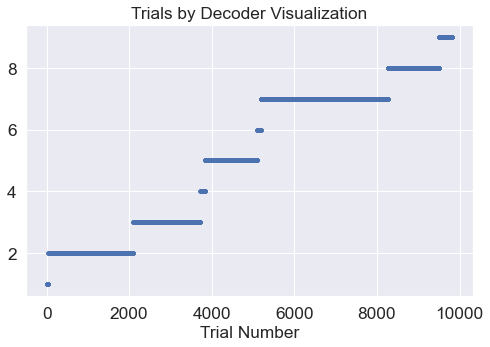

In [22]:
# shows you how the decoders are used across the trials
n_bmiUnitsDec, bmiTrialsPerDecoder, bmiTrialsPerSession = getTrialsByDecoder(n_dict)

In [23]:
n_bmiUnitsDec.shape

(9828,)

Dealing with Decoder 2 Only

In [24]:
# start and end trial indices
decNum = 2
startInd, endInd = returnDecoderIndices(bmiTrialsPerDecoder, decNum)
(startInd, endInd)

(41, 2097)

In [25]:
succIdx1 = np.where((n_dict['trEs_bmi'][startInd:endInd, succCol] == 8) | (n_dict['trEs_bmi'][startInd:endInd, succCol] == 9))[0]
succIdx1.shape

(2047,)

In [26]:
trEv = n_dict['trEs_bmi'][startInd:endInd, :]
trEv.shape
succIdx = findSuccessfulTrials(trEv, succCol)
# print(*succIdx)

success indx shape: (2047,) out of total events: 2056


now only looking at successful trials within decoder 2

In [27]:
# so looking only at successful neural data during decoder 2

# time bins x bmi units x trials for decoder 2

# nBMI_decoder2 = n_bmiUnits[:,:,startInd:endInd]
nBMI_decoder2 = n_bmiUnits[:,:,startInd+succIdx]

In [28]:
nBMI_decoder2.shape

(40, 19, 2047)

In [29]:
n_dict['trEs_bmi']

array([[ 2., 70., 15., ..., 12.,  2., 70.],
       [ 2., 70., 15., ...,  7.,  9., 11.],
       [ 2., 64., 15., ..., 12.,  2., 64.],
       ...,
       [ 2., 71., 15., ...,  7.,  9., 11.],
       [ 2., 66., 15., ...,  7.,  9., 11.],
       [ 2., 64., 15., ...,  7.,  8.,  2.]])

Len of targVect 2047
non-targets: [ 639  899 1657 1984]
non-targets: [2006]
Number of non-targets: 5
Num of Trials to Expect: 2042
1
Target 1 :  231.0
2
Target 2 :  202.0
3
Target 3 :  212.0
4
Target 4 :  283.0
5
Target 5 :  315.0
6
Target 6 :  313.0
7
Target 7 :  244.0
8
Target 8 :  242.0
expected number of trials


Text(0.5, 1.0, 'Number of Trials per Target in Decoder2')

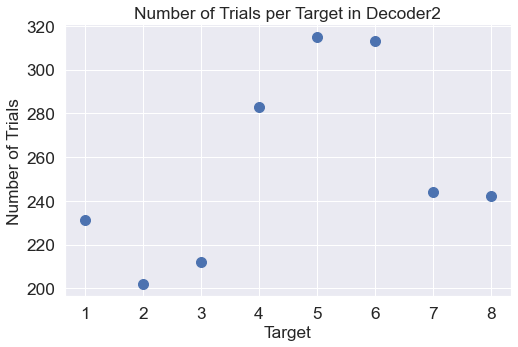

In [30]:
# get the targVector
targCol = 1
targVect = n_dict['trEs_bmi'][startInd+succIdx, targCol] - 63
# targVect = n_dict['trEs_bmi'][startInd:endInd, targCol] - 63
print("Len of targVect", len(targVect))
if (np.any(targVect > 8) or np.any(targVect < 1)):
    print("non-targets:", np.where(targVect > 8)[0])
    print("non-targets:", np.where(targVect < 1)[0])
    print("Number of non-targets:", len(np.where(targVect > 8)[0]) + len(np.where(targVect < 1)[0]))
    print("Num of Trials to Expect:", len(targVect)- (len(np.where(targVect > 8)[0]) + len(np.where(targVect < 1)[0])))
    
targNum = np.zeros(8) 
for iT in range(1, 9, 1):
    print(iT)
    targNum[iT-1] = len(np.where(targVect == iT)[0])
    print("Target", iT, ": ", targNum[iT-1])
sum(targNum)

if (sum(targNum) == len(targVect)- (len(np.where(targVect > 8)[0]) + len(np.where(targVect < 1)[0]))):
    print("expected number of trials")
else:
    print("error somewhere")

plt.plot(np.arange(1,9,1), targNum, '.', markersize = 20)
plt.xlabel("Target")
plt.ylabel("Number of Trials")
plt.title("Number of Trials per Target in Decoder" + str(decNum))

In [31]:
targVect.shape

(2047,)

Text(0.5, 1.0, 'Looking at the targets for trials')

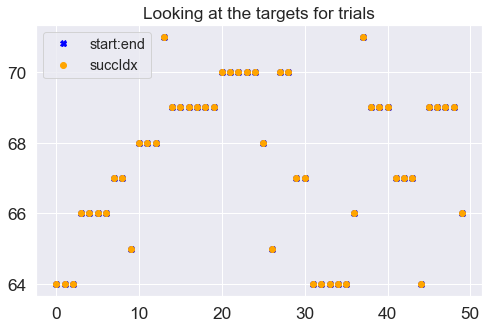

In [32]:
plt.plot(n_dict['trEs_bmi'][startInd:endInd, targCol][0:50], 'X', color='blue', label='start:end')
# plt.ylim((60,80))
# plt.show()
plt.plot(n_dict['trEs_bmi'][startInd+succIdx, targCol][0:50], 'o' , color='orange', label='succIdx')
plt.legend()
plt.title("Looking at the targets for trials")

In [33]:
(n_bmiUnitsT1, n_bmiUnitsT2, n_bmiUnitsT3, n_bmiUnitsT4, n_bmiUnitsT5, n_bmiUnitsT6, n_bmiUnitsT7, n_bmiUnitsT8) = sortTargetNeuralData(nBMI_decoder2[:,:,:], targVect)

# check to see these match
if (n_bmiUnitsT1.shape[-1] != targNum[0]):
    print("error in targ 1")
if (n_bmiUnitsT2.shape[-1] != targNum[1]):
    print("error in targ 2")
if (n_bmiUnitsT3.shape[-1] != targNum[2]):
    print("error in targ 3")
if (n_bmiUnitsT4.shape[-1] != targNum[3]):
    print("error in targ 4")
if (n_bmiUnitsT5.shape[-1] != targNum[4]):
    print("error in targ 5")
if (n_bmiUnitsT6.shape[-1] != targNum[5]):
    print("error in targ 6")
if (n_bmiUnitsT7.shape[-1] != targNum[6]):
    print("error in targ 7")
if (n_bmiUnitsT8.shape[-1] != targNum[7]):
    print("error in targ 8")

Starting nData dims 3
nData shape (40, 19, 2047)


In [34]:
# time bins x bmi neurons x trials in decoder 2n_bmiUnitsT1.shape
n_bmiUnitsT8.shape

(40, 19, 242)

In [35]:
n_dict['binvector']

array([-2.00000000e+00, -1.90000000e+00, -1.80000000e+00, -1.70000000e+00,
       -1.60000000e+00, -1.50000000e+00, -1.40000000e+00, -1.30000000e+00,
       -1.20000000e+00, -1.10000000e+00, -1.00000000e+00, -9.00000000e-01,
       -8.00000000e-01, -7.00000000e-01, -6.00000000e-01, -5.00000000e-01,
       -4.00000000e-01, -3.00000000e-01, -2.00000000e-01, -1.00000000e-01,
       -2.22044605e-16,  1.00000000e-01,  2.00000000e-01,  3.00000000e-01,
        4.00000000e-01,  5.00000000e-01,  6.00000000e-01,  7.00000000e-01,
        8.00000000e-01,  9.00000000e-01,  1.00000000e+00,  1.10000000e+00,
        1.20000000e+00,  1.30000000e+00,  1.40000000e+00,  1.50000000e+00,
        1.60000000e+00,  1.70000000e+00,  1.80000000e+00,  1.90000000e+00])

In [36]:
# Average per trial per time bin per neuron
# 1
n_bmiAvgT1 = np.mean(n_bmiUnitsT1, axis=2)
n_bmiAvgT2 = np.mean(n_bmiUnitsT2, axis=2)
n_bmiAvgT3 = np.mean(n_bmiUnitsT3, axis=2)
n_bmiAvgT4 = np.mean(n_bmiUnitsT4, axis=2)
n_bmiAvgT5 = np.mean(n_bmiUnitsT5, axis=2)
n_bmiAvgT6 = np.mean(n_bmiUnitsT6, axis=2)
n_bmiAvgT7 = np.mean(n_bmiUnitsT7, axis=2)
n_bmiAvgT8 = np.mean(n_bmiUnitsT8, axis=2)

In [37]:
import matplotlib.backends.backend_pdf
outDir = "/Users/mmadduri/Documents/PhD/ResearchMaterials/Code/BMI_Model/data/jeev_analysis/"
outFile = 'output' + nDir + '.pdf'
pdf = matplotlib.backends.backend_pdf.PdfPages(outDir + outFile)

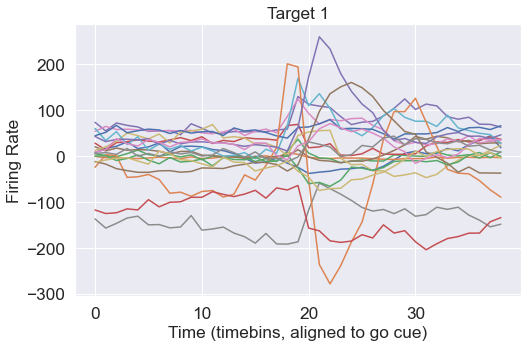

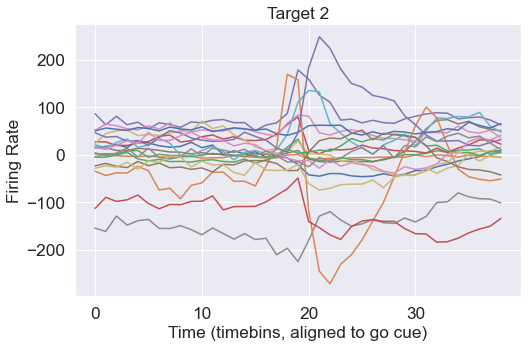

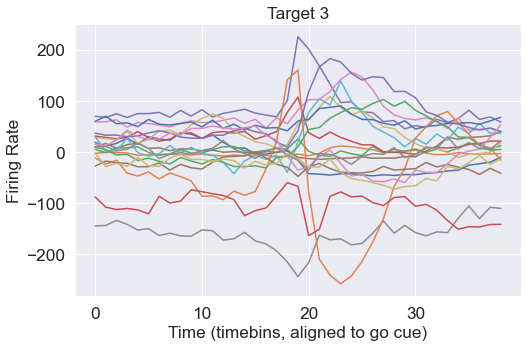

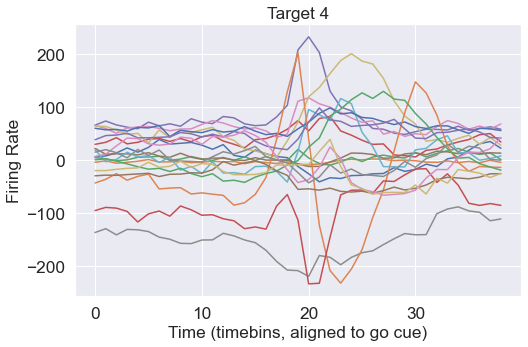

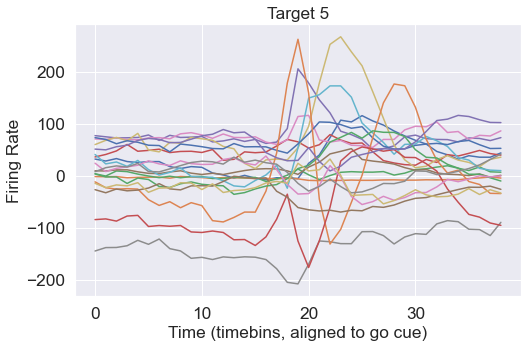

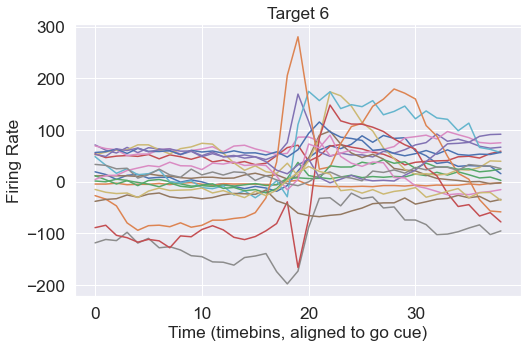

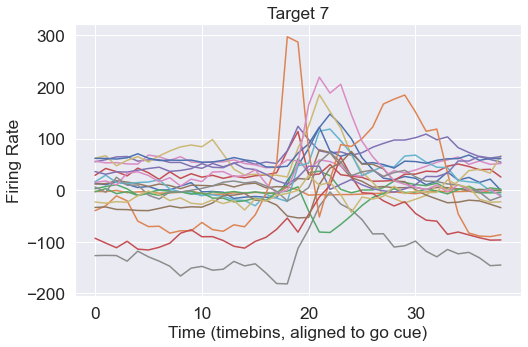

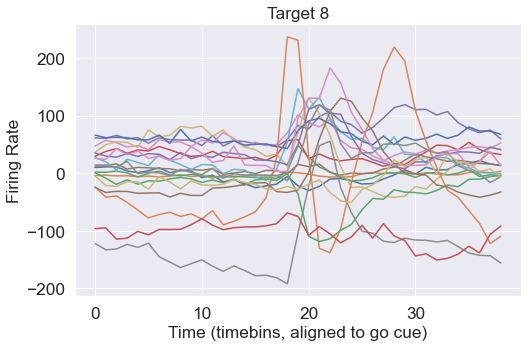

In [38]:
# Plot across time per neuron
plt.plot(n_bmiAvgT1[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 1")
plt.show()

plt.plot(n_bmiAvgT2[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 2")
plt.show()

plt.plot(n_bmiAvgT3[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 3")
plt.show()

plt.plot(n_bmiAvgT4[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 4")
plt.show()

plt.plot(n_bmiAvgT5[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 5")
plt.show()

plt.plot(n_bmiAvgT6[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 6")
plt.show()

plt.plot(n_bmiAvgT7[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 7")
plt.show()

plt.plot(n_bmiAvgT8[:-1,:])
plt.xlabel("Time (timebins, aligned to go cue)")
plt.ylabel("Firing Rate")
plt.title("Target 8")
plt.show()

In [39]:
n_bmiUnitsT8.shape
n_bmiUnitsT8[1,1,:].shape

(242,)

In [40]:
n_dict['binvector']

array([-2.00000000e+00, -1.90000000e+00, -1.80000000e+00, -1.70000000e+00,
       -1.60000000e+00, -1.50000000e+00, -1.40000000e+00, -1.30000000e+00,
       -1.20000000e+00, -1.10000000e+00, -1.00000000e+00, -9.00000000e-01,
       -8.00000000e-01, -7.00000000e-01, -6.00000000e-01, -5.00000000e-01,
       -4.00000000e-01, -3.00000000e-01, -2.00000000e-01, -1.00000000e-01,
       -2.22044605e-16,  1.00000000e-01,  2.00000000e-01,  3.00000000e-01,
        4.00000000e-01,  5.00000000e-01,  6.00000000e-01,  7.00000000e-01,
        8.00000000e-01,  9.00000000e-01,  1.00000000e+00,  1.10000000e+00,
        1.20000000e+00,  1.30000000e+00,  1.40000000e+00,  1.50000000e+00,
        1.60000000e+00,  1.70000000e+00,  1.80000000e+00,  1.90000000e+00])

In [41]:
alignCue = np.where((n_dict['binvector'] < .000001) & (n_dict['binvector'] > -.000001) == 1)[0][0]
print("align cue = ", alignCue)
print("max events = ", len(n_dict['binvector']) )

align cue =  20
max events =  40


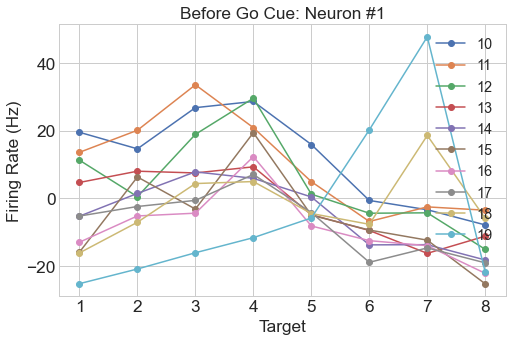

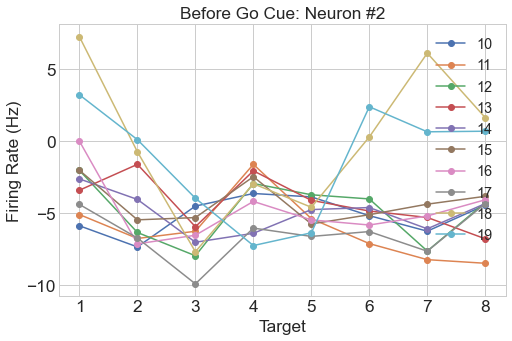

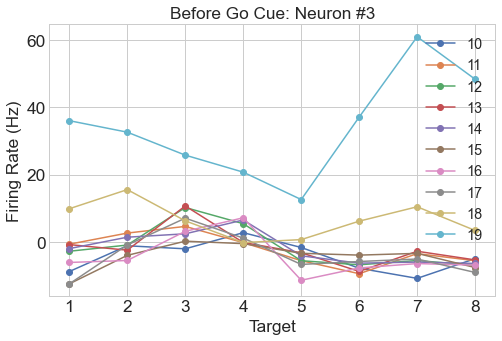

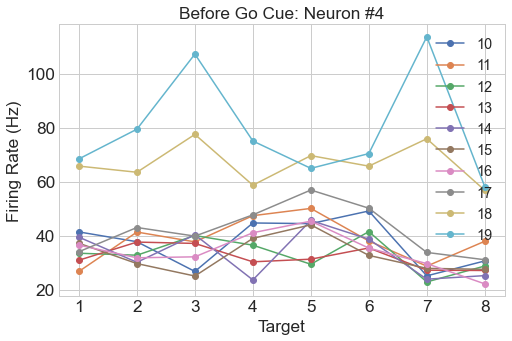

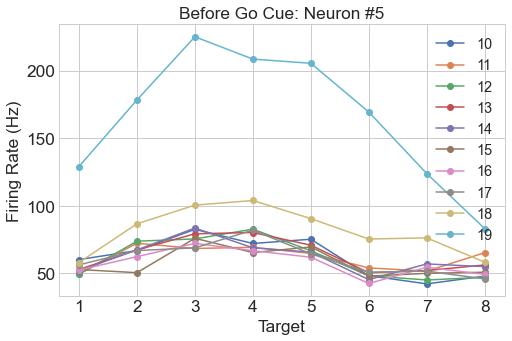

...

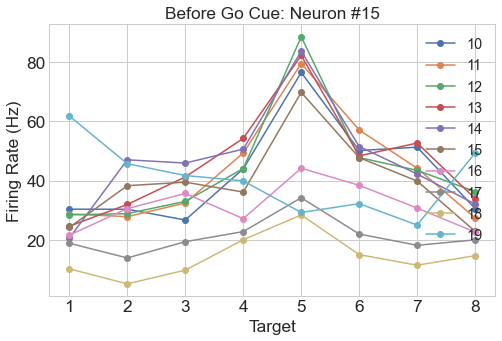

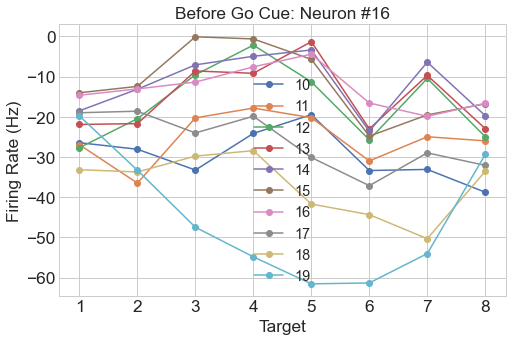

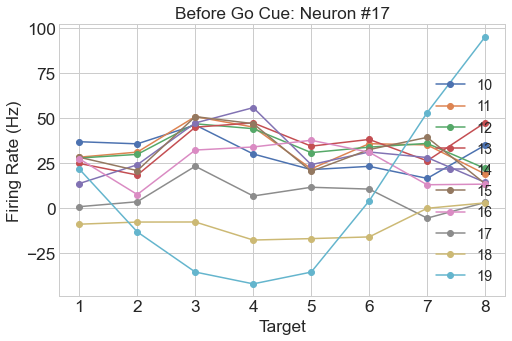

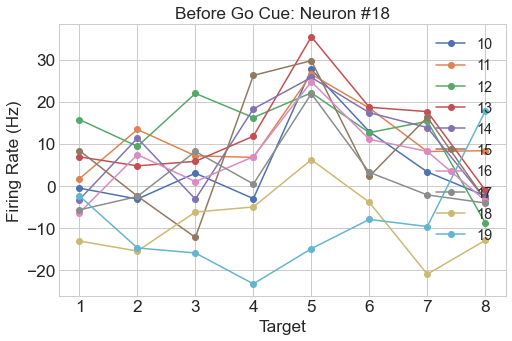

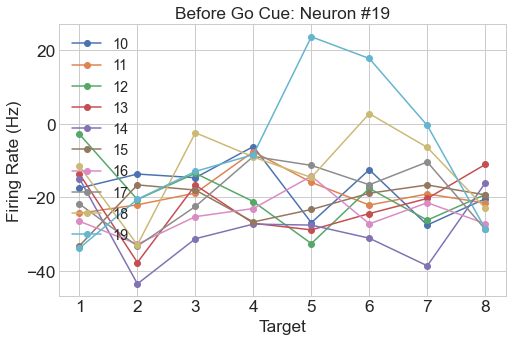

In [42]:
numNeurons = n_bmiUnitsT8.shape[1]

# 10 is the number of time bins
n_bmiTargTime = np.zeros(8)
plt.style.use(plt.style.available[24])


# going through each neuron
for iN in range(numNeurons):
    # for each time bin
    fig = plt.figure()
    for iT in range(alignCue - 10, alignCue, 1):
    # 40 x neurons x trials 
        n_bmiTargTime[0] = np.mean(n_bmiUnitsT1[iT, iN, :])
        n_bmiTargTime[1] = np.mean(n_bmiUnitsT2[iT, iN, :])
        n_bmiTargTime[2] = np.mean(n_bmiUnitsT3[iT, iN, :])
        n_bmiTargTime[3] = np.mean(n_bmiUnitsT4[iT, iN, :])
        n_bmiTargTime[4] = np.mean(n_bmiUnitsT5[iT, iN, :])
        n_bmiTargTime[5] = np.mean(n_bmiUnitsT6[iT, iN, :])
        n_bmiTargTime[6] = np.mean(n_bmiUnitsT7[iT, iN, :])
        n_bmiTargTime[7] = np.mean(n_bmiUnitsT8[iT, iN, :])
        plt.plot(np.arange(1,9,1), n_bmiTargTime, '-o', label=iT)
    plt.title("Before Go Cue: Neuron #" + str(iN+1))
    plt.xlabel("Target")
    plt.ylabel("Firing Rate (Hz)")
    plt.legend()
    pdf.savefig(fig)




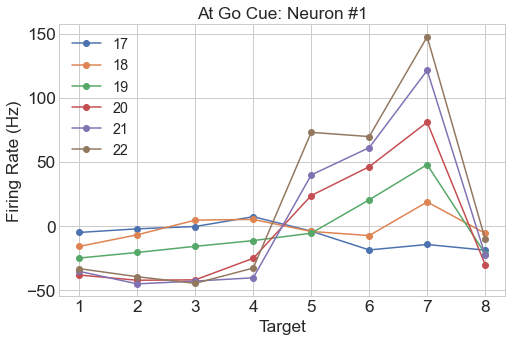

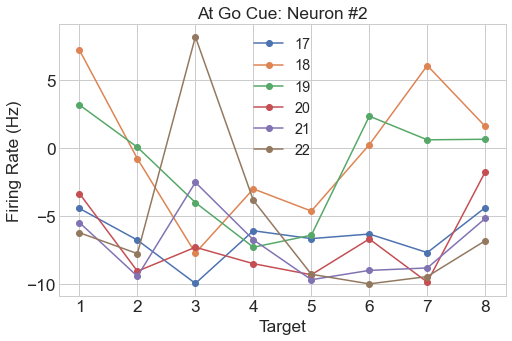

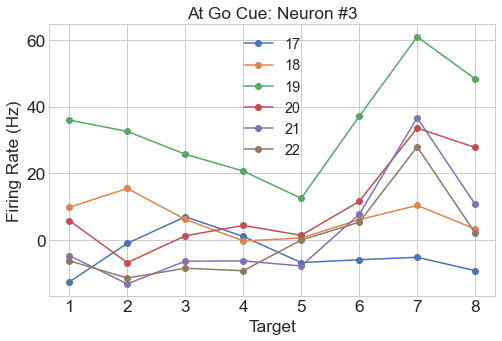

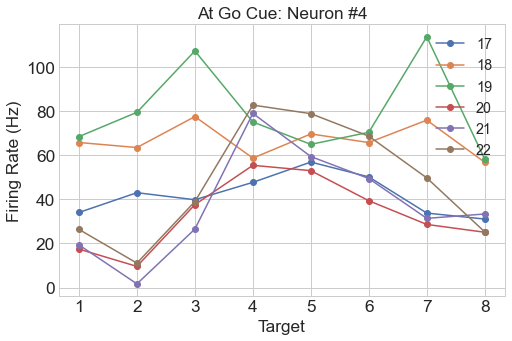

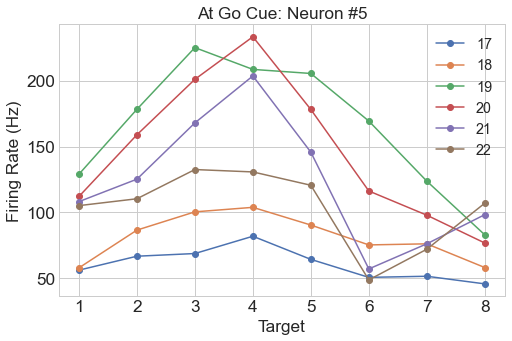

...

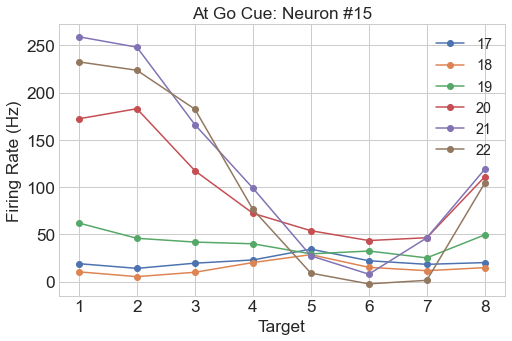

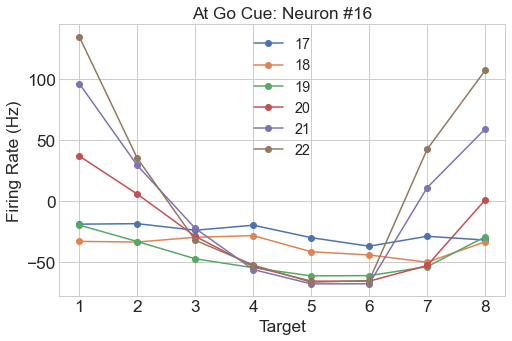

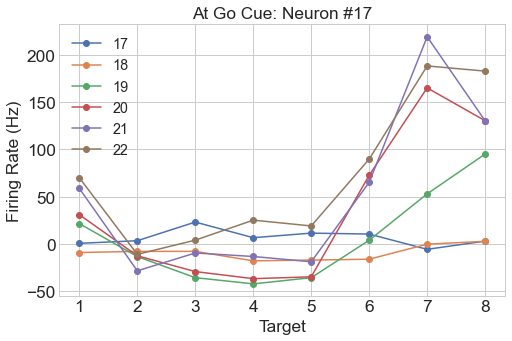

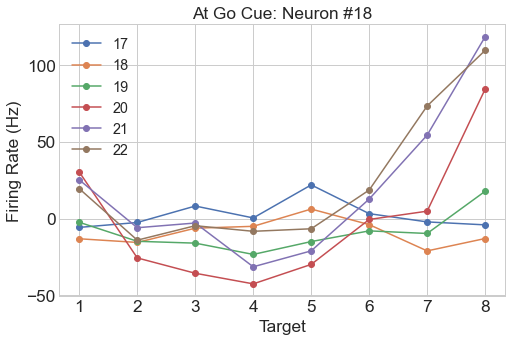

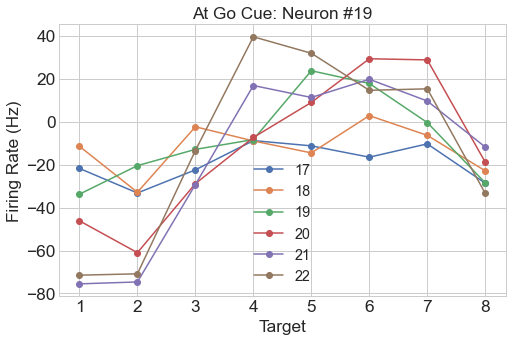

In [43]:
alignCue = np.where((n_dict['binvector'] < .000001) & (n_dict['binvector'] > -.000001) == 1)[0][0]
numNeurons = n_bmiUnitsT8.shape[1]

# 10 is the number of time bins
n_bmiTargTime = np.zeros(8)
plt.style.use(plt.style.available[24])


# going through each neuron
for iN in range(numNeurons):
    # for each time bin
    fig = plt.figure()
    for iT in range(alignCue - 3, alignCue + 3, 1):
    # 40 x neurons x trials 
        n_bmiTargTime[0] = np.mean(n_bmiUnitsT1[iT, iN, :])
        n_bmiTargTime[1] = np.mean(n_bmiUnitsT2[iT, iN, :])
        n_bmiTargTime[2] = np.mean(n_bmiUnitsT3[iT, iN, :])
        n_bmiTargTime[3] = np.mean(n_bmiUnitsT4[iT, iN, :])
        n_bmiTargTime[4] = np.mean(n_bmiUnitsT5[iT, iN, :])
        n_bmiTargTime[5] = np.mean(n_bmiUnitsT6[iT, iN, :])
        n_bmiTargTime[6] = np.mean(n_bmiUnitsT7[iT, iN, :])
        n_bmiTargTime[7] = np.mean(n_bmiUnitsT8[iT, iN, :])
        plt.plot(np.arange(1,9,1), n_bmiTargTime, '-o', label=iT)
#         seaborn.lineplot(data=n_bmiTargTime, x="timepoint", y="signal", hue="event")
    plt.title("At Go Cue: Neuron #" + str(iN+1))
    plt.xlabel("Target")
    plt.ylabel("Firing Rate (Hz)")
    plt.legend()
    pdf.savefig(fig)

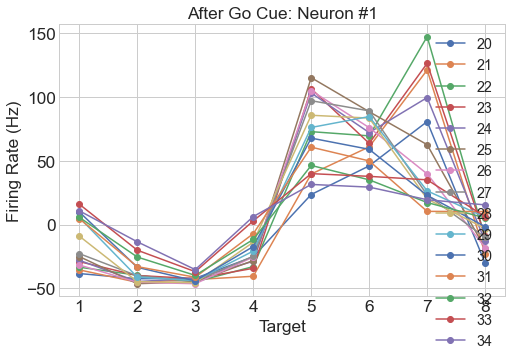

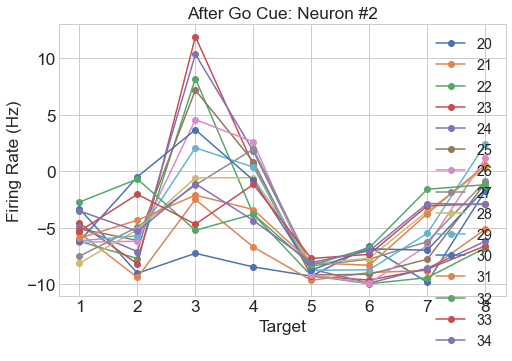

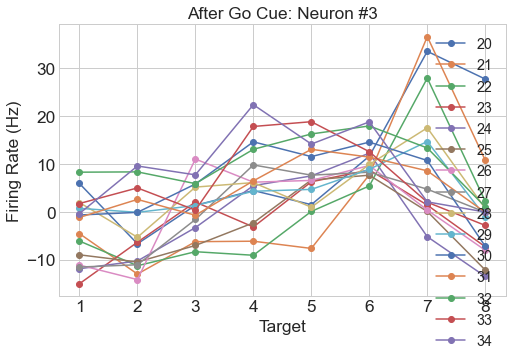

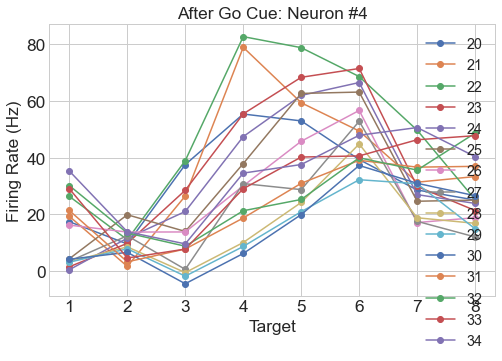

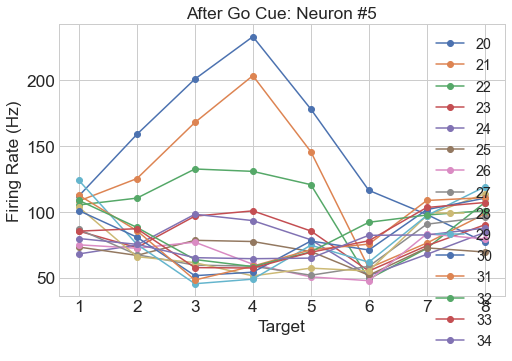

...

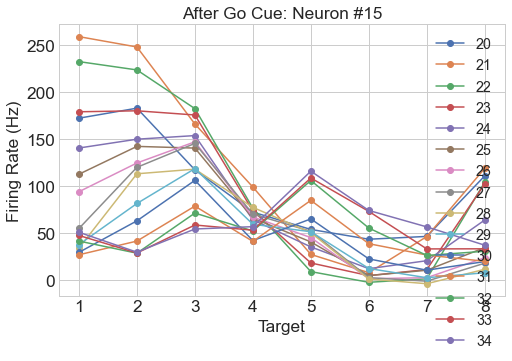

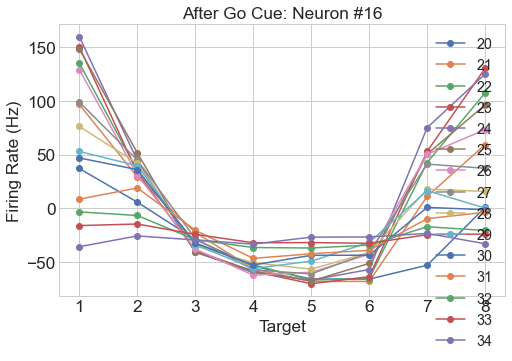

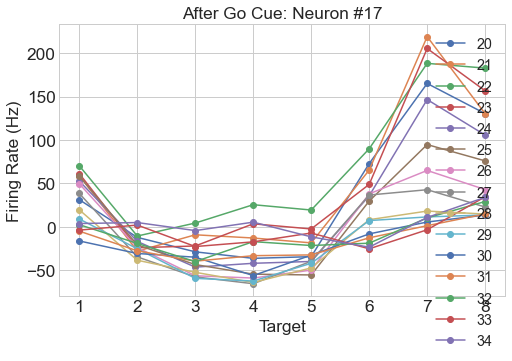

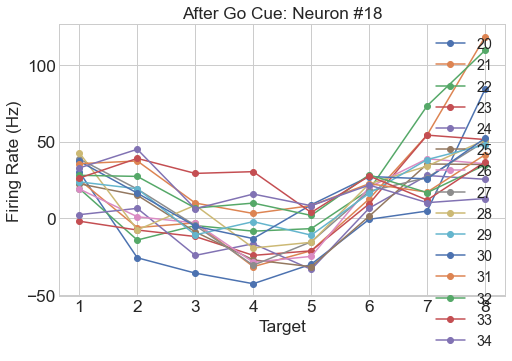

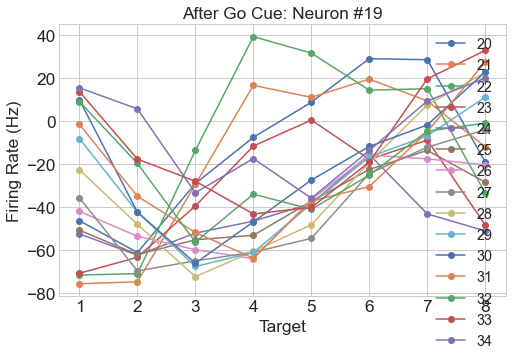

In [44]:
alignCue = np.where((n_dict['binvector'] < .000001) & (n_dict['binvector'] > -.000001) == 1)[0][0]
numNeurons = n_bmiUnitsT8.shape[1]

# 10 is the number of time bins
n_bmiTargTime = np.zeros(8)
plt.style.use(plt.style.available[24])


# going through each neuron
for iN in range(numNeurons):
    # for each time bin
    fig = plt.figure()
    for iT in range(alignCue, alignCue + 15, 1):
    # 40 x neurons x trials 
        n_bmiTargTime[0] = np.mean(n_bmiUnitsT1[iT, iN, :])
        n_bmiTargTime[1] = np.mean(n_bmiUnitsT2[iT, iN, :])
        n_bmiTargTime[2] = np.mean(n_bmiUnitsT3[iT, iN, :])
        n_bmiTargTime[3] = np.mean(n_bmiUnitsT4[iT, iN, :])
        n_bmiTargTime[4] = np.mean(n_bmiUnitsT5[iT, iN, :])
        n_bmiTargTime[5] = np.mean(n_bmiUnitsT6[iT, iN, :])
        n_bmiTargTime[6] = np.mean(n_bmiUnitsT7[iT, iN, :])
        n_bmiTargTime[7] = np.mean(n_bmiUnitsT8[iT, iN, :])
        plt.plot(np.arange(1,9,1), n_bmiTargTime, '-o', label=iT)
#         seaborn.lineplot(data=n_bmiTargTime, x="timepoint", y="signal", hue="event")
    plt.title("After Go Cue: Neuron #" + str(iN+1))
    plt.xlabel("Target")
    plt.ylabel("Firing Rate (Hz)")
    plt.legend()
    pdf.savefig(fig)

## Measuring Covariance

In [45]:
# time x neurons x trials
n_bmiUnitsT8.shape

(40, 19, 242)

In [46]:
from matplotlib import cm

alignCue = np.where((n_dict['binvector'] < .000001) & (n_dict['binvector'] > -.000001) == 1)[0][0]
numNeurons = n_bmiUnitsT8.shape[1]
numBins = n_bmiUnitsT8.shape[0]

start = 0
stop = 0.4
number_of_lines= numBins
cm_subsection = np.linspace(start, stop, number_of_lines) 

colors = [ cm.jet(x) for x in cm_subsection ]

In [47]:
# colors
numBins

40

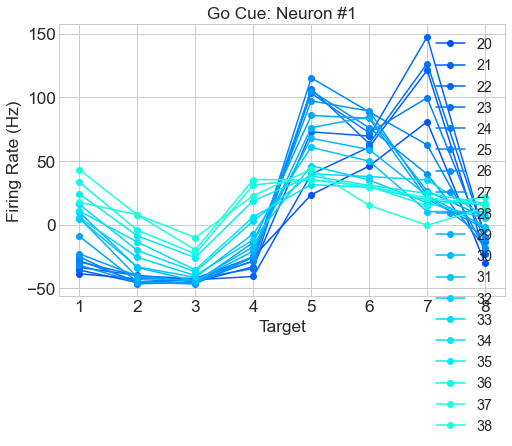

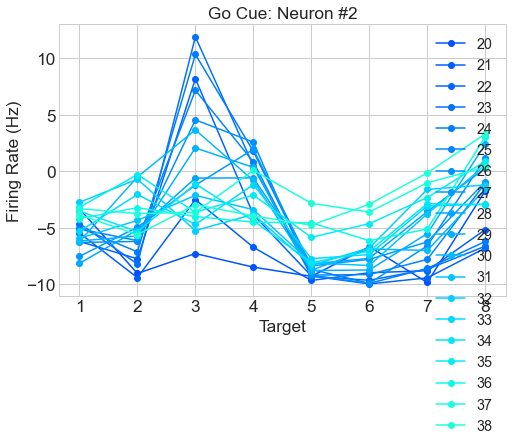

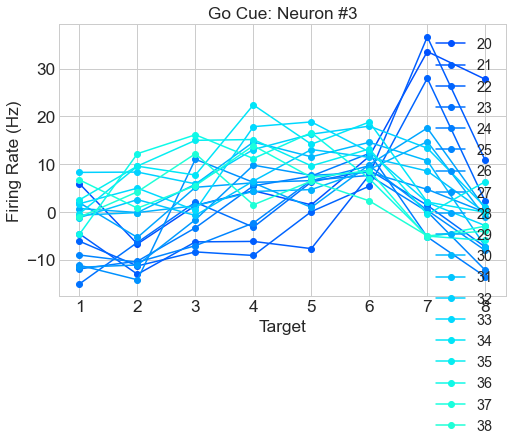

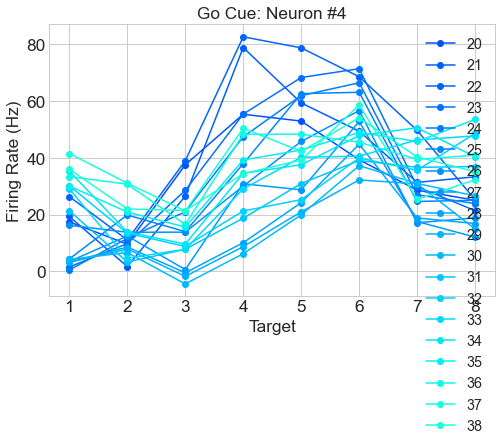

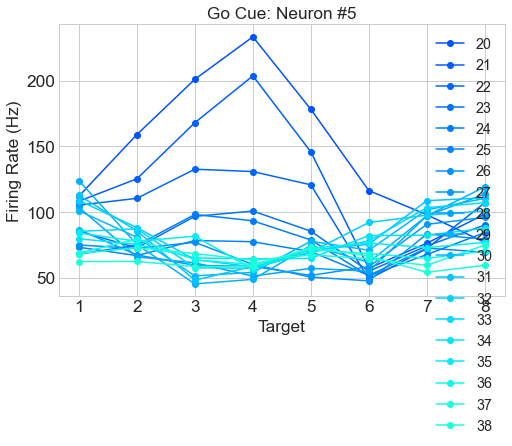

...

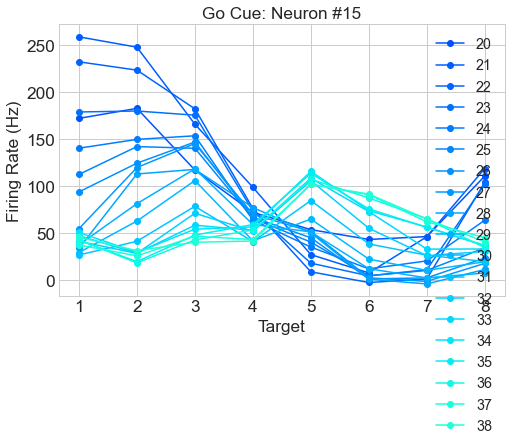

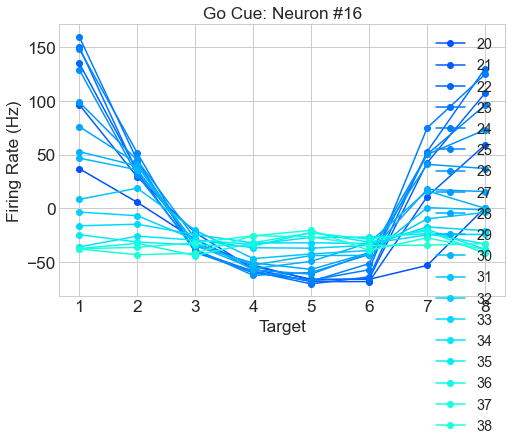

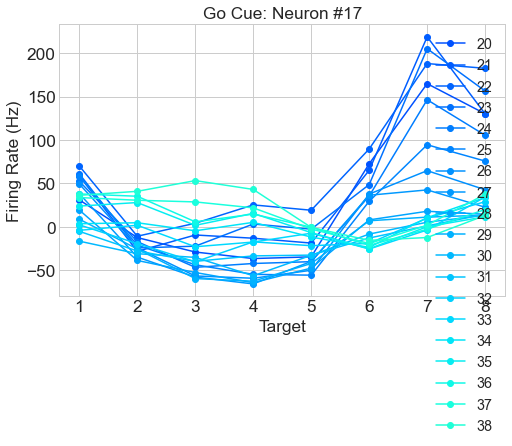

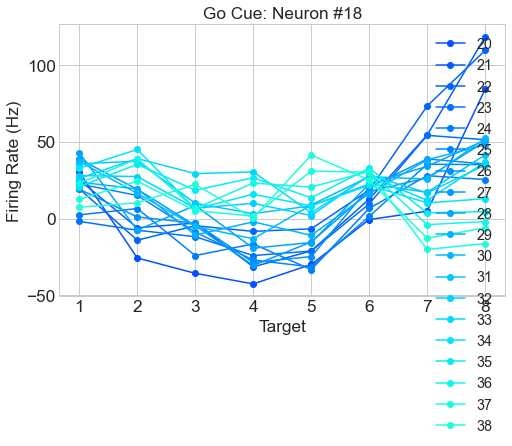

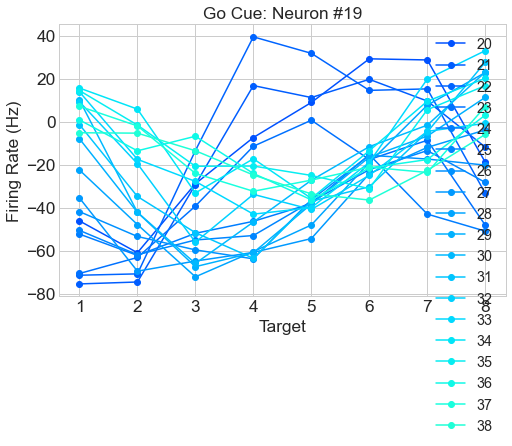

In [48]:
# 10 is the number of time bins
numTarg = 8
n_bmiTargTime = np.zeros(numTarg)
# plt.style.use(plt.style.available[24])


# going through each neuron
for iN in range(numNeurons):
    # for each time bin
    fig = plt.figure()
    for iT in range(alignCue, numBins-1, 1):
    # 40 x neurons x trials 
        n_bmiTargTime[0] = np.mean(n_bmiUnitsT1[iT, iN, :])
        n_bmiTargTime[1] = np.mean(n_bmiUnitsT2[iT, iN, :])
        n_bmiTargTime[2] = np.mean(n_bmiUnitsT3[iT, iN, :])
        n_bmiTargTime[3] = np.mean(n_bmiUnitsT4[iT, iN, :])
        n_bmiTargTime[4] = np.mean(n_bmiUnitsT5[iT, iN, :])
        n_bmiTargTime[5] = np.mean(n_bmiUnitsT6[iT, iN, :])
        n_bmiTargTime[6] = np.mean(n_bmiUnitsT7[iT, iN, :])
        n_bmiTargTime[7] = np.mean(n_bmiUnitsT8[iT, iN, :])
        plt.plot(np.arange(1,9,1), n_bmiTargTime,'-o', color = colors[iT], label=iT)
        
    plt.title("Go Cue: Neuron #" + str(iN+1))
    plt.xlabel("Target")
    plt.ylabel("Firing Rate (Hz)")
    plt.legend()

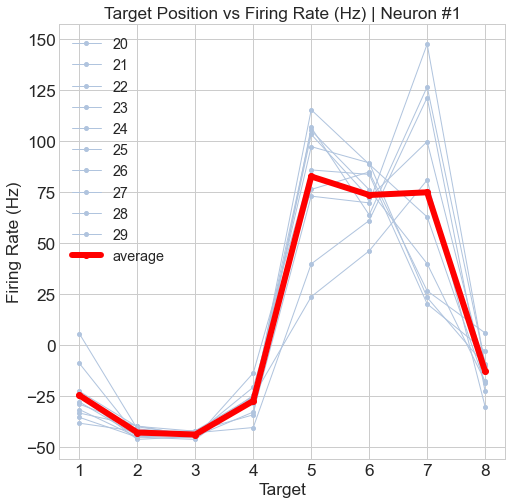

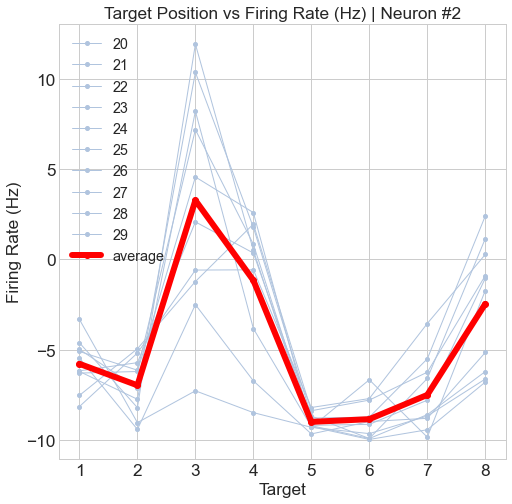

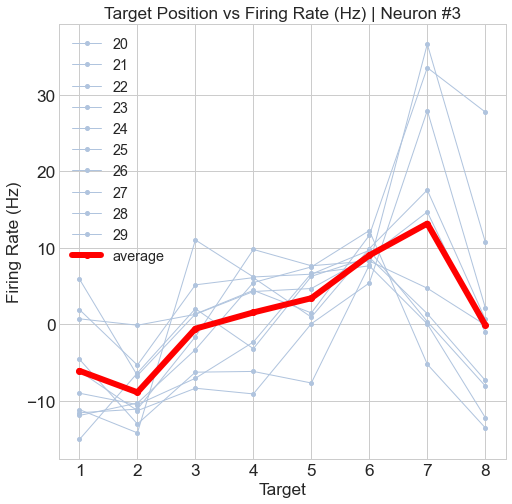

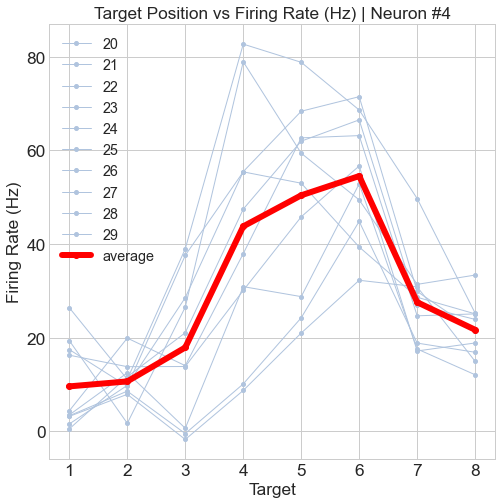

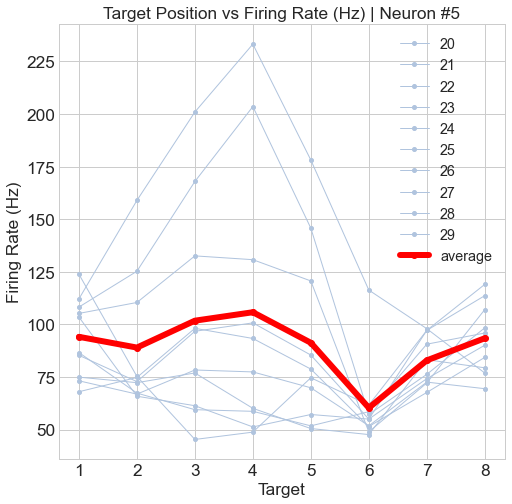

...

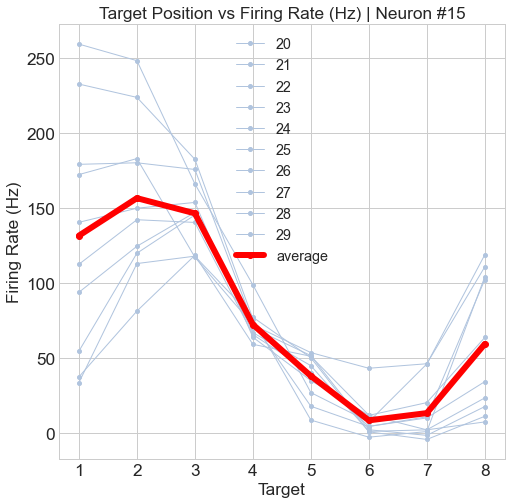

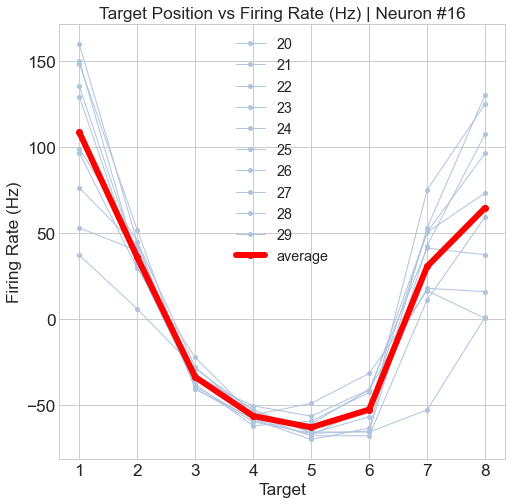

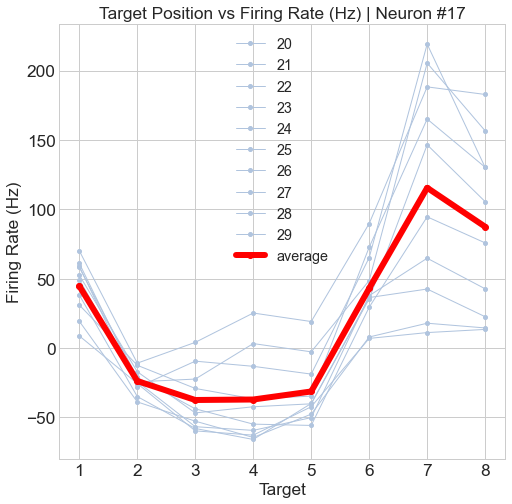

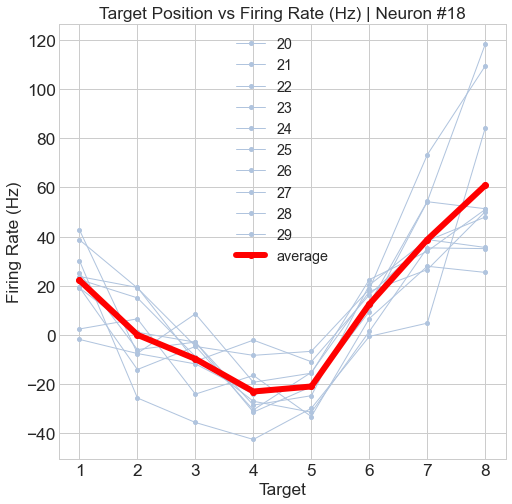

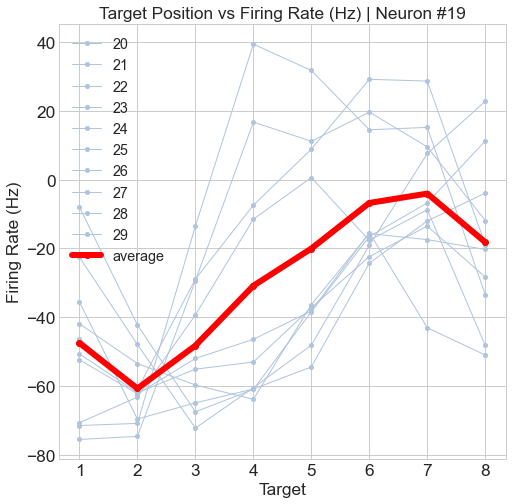

In [49]:
# 10 is the number of time bins
numTarg = 8
# numBins = np.arange(alignCue, numBins-1, 1)
n_bmiTargTime = np.zeros(numTarg)
n_bmiTargSum = np.zeros((numNeurons, numTarg))
# binsArray = np.arange(alignCue, numBins-1, 1) 
binsArray = np.arange(alignCue, alignCue+10, 1) 

# plt.style.use(plt.style.available[24])


# going through each neuron
for iN in range(numNeurons):
    # for each time bin
    fig = plt.figure(figsize=(8,8))
#     plt.subplot(1, 2, 1)
    for iT in binsArray:
    # 40 x neurons x trials 
    
        n_bmiTargTime[0] = np.mean(n_bmiUnitsT1[iT, iN, :])
        n_bmiTargTime[1] = np.mean(n_bmiUnitsT2[iT, iN, :])
        n_bmiTargTime[2] = np.mean(n_bmiUnitsT3[iT, iN, :])
        n_bmiTargTime[3] = np.mean(n_bmiUnitsT4[iT, iN, :])
        n_bmiTargTime[4] = np.mean(n_bmiUnitsT5[iT, iN, :])
        n_bmiTargTime[5] = np.mean(n_bmiUnitsT6[iT, iN, :])
        n_bmiTargTime[6] = np.mean(n_bmiUnitsT7[iT, iN, :])
        n_bmiTargTime[7] = np.mean(n_bmiUnitsT8[iT, iN, :])
        plt.plot(np.arange(1,9,1), n_bmiTargTime,'-o', color = 'lightsteelblue', markersize=4, linewidth= 1,label=iT)
        n_bmiTargSum[iN] = n_bmiTargSum[iN] + n_bmiTargTime  
        
#     plt.title("Go Cue: Neuron #" + str(iN+1))
#     plt.xlabel("Target")
#     plt.ylabel("Firing Rate (Hz)")
    plt.legend()
#     plt.subplot(1, 2, 2)
    plt.plot(np.arange(1,9,1), n_bmiTargSum[iN]/(len(binsArray)),'-o', color ='red', linewidth=6, label='average')
#     seaborn.heatmap(n_bmiTargTime, fmt='g')
    #     plt.plot(np.arange(1,9,1), n_bmiTargTime,'-o', color = colors[iT], label=iT)
# #                  color = '' + str(iT/numBins), label=iT)
# #         seaborn.lineplot(data=n_bmiTargTime, x="timepoint", y="signal", hue="event")
    plt.title("Target Position vs Firing Rate (Hz) | Neuron #" + str(iN+1))
    plt.xlabel("Target")
    plt.ylabel("Firing Rate (Hz)")
    plt.legend()
#     pdf.savefig(fig)

normalization: x_norm = (x - x_min)/(x_max - x_min)

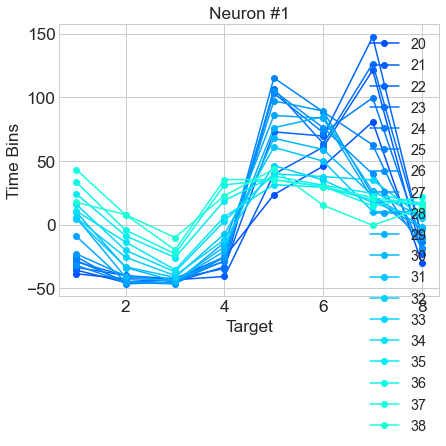

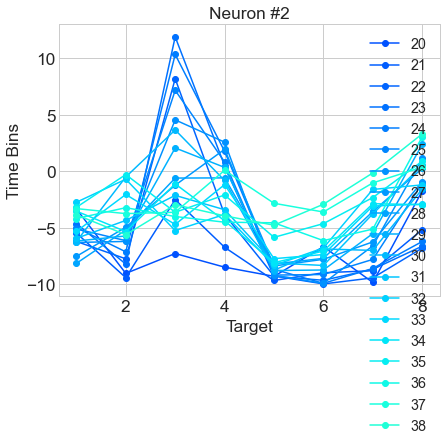

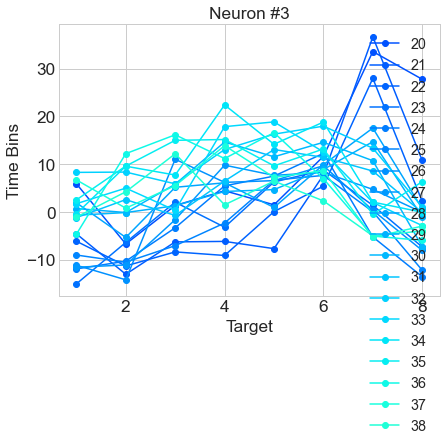

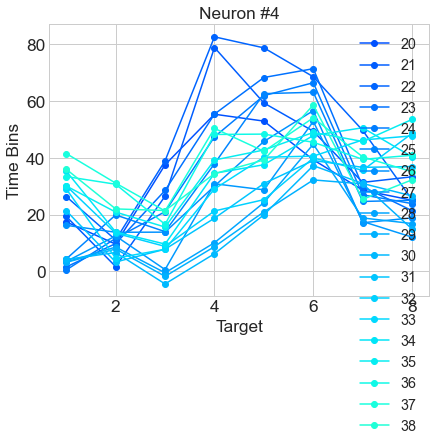

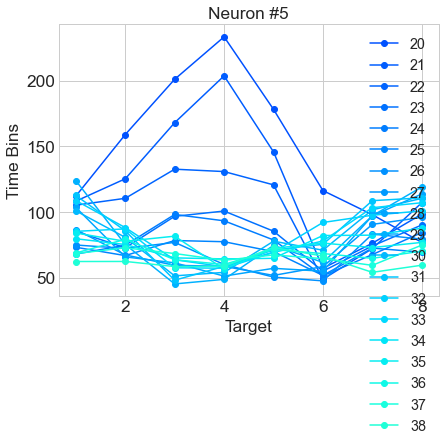

...

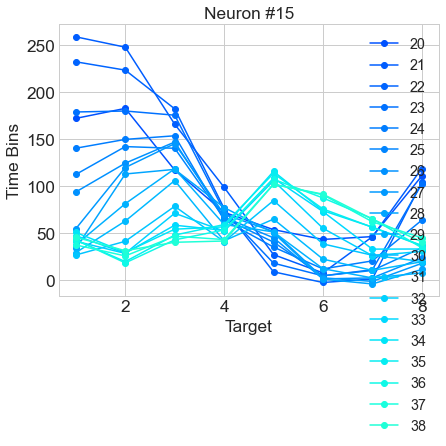

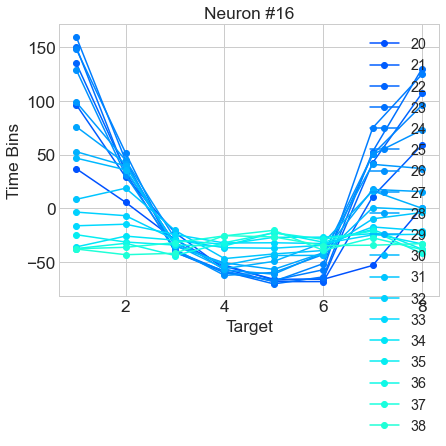

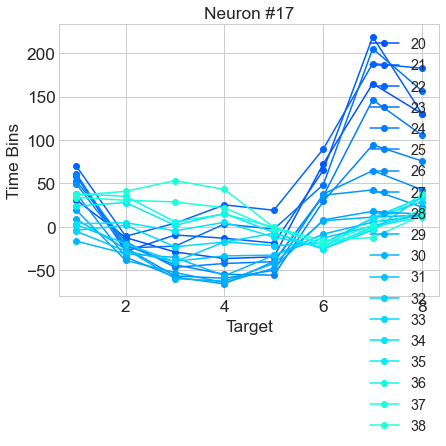

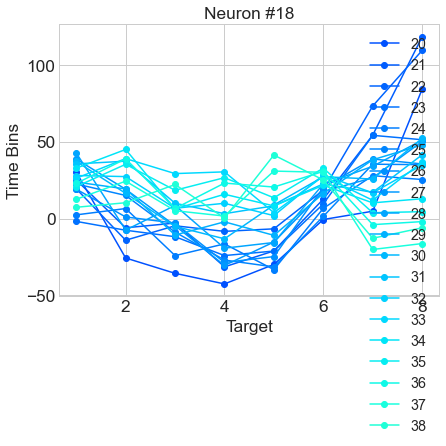

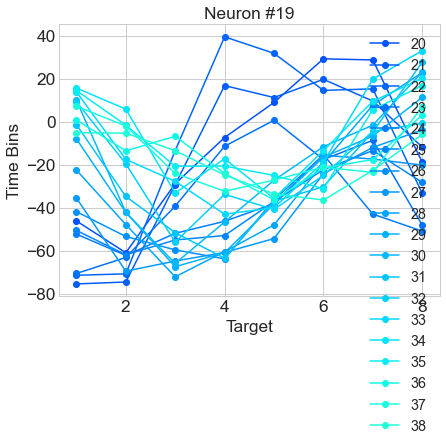

In [59]:
# 10 is the number of time bins
numTarg = 8
# numBins = 30
# plt.style.use(plt.style.available[24])

tStart = alignCue
tStop = numBins - 1

# going through each neuron
for iN in range(numNeurons):
    n_bmiTargTime = np.zeros((numBins, numTarg))
    n_bmiMin = np.zeros_like(n_bmiTargTime)
    # for each time bin
    fig = plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    for iT in range(tStart, tStop, 1):
    # 40 x neurons x trials 
        n_bmiTargTime[iT, 0] = np.mean(n_bmiUnitsT1[iT, iN, :])
        n_bmiTargTime[iT, 1] = np.mean(n_bmiUnitsT2[iT, iN, :])
        n_bmiTargTime[iT, 2] = np.mean(n_bmiUnitsT3[iT, iN, :])
        n_bmiTargTime[iT, 3] = np.mean(n_bmiUnitsT4[iT, iN, :])
        n_bmiTargTime[iT, 4] = np.mean(n_bmiUnitsT5[iT, iN, :])
        n_bmiTargTime[iT, 5] = np.mean(n_bmiUnitsT6[iT, iN, :])
        n_bmiTargTime[iT, 6] = np.mean(n_bmiUnitsT7[iT, iN, :])
        n_bmiTargTime[iT, 7] = np.mean(n_bmiUnitsT8[iT, iN, :])
        plt.plot(np.arange(1,9,1), n_bmiTargTime[iT], '-o', color = colors[iT], label=iT)
    plt.xlabel("Target")
    plt.ylabel("Time Bins")
    plt.legend()
    plt.title("Neuron #" + str(iN + 1))
      
#     # time bins x target matrix
#     # find the lowest number per target -- find np.min along column
#     min_targ = np.min(n_bmiTargTime, axis=0)

#     for iR in range(numTarg):
#         n_bmiMin[:, iR] = n_bmiTargTime[:, iR] - min_targ[iR]
#         max_nBmiMin = np.max(n_bmiMin[:, iR])
#         n_bmiMin[:, iR] = n_bmiMin[:, iR]/max_nBmiMin
# #     fig = plt.figure()
#     plt.subplot(1, 2, 2)
#     ax = seaborn.heatmap(n_bmiMin, fmt='g')
#     ax.invert_yaxis()
#     plt.xlabel("Target")
#     plt.ylabel("Time Bins")
#     plt.title("Neuron #" + str(iN + 1))


Within trial cosine fitting

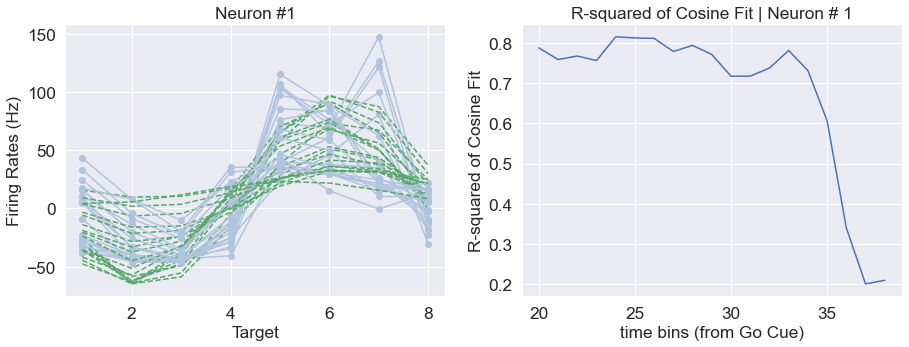

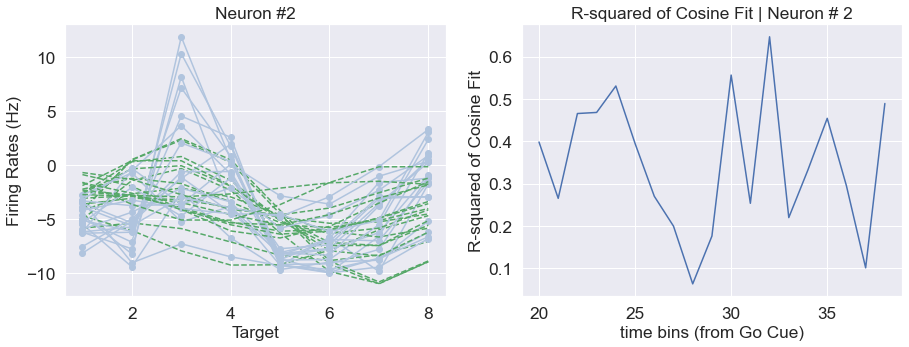

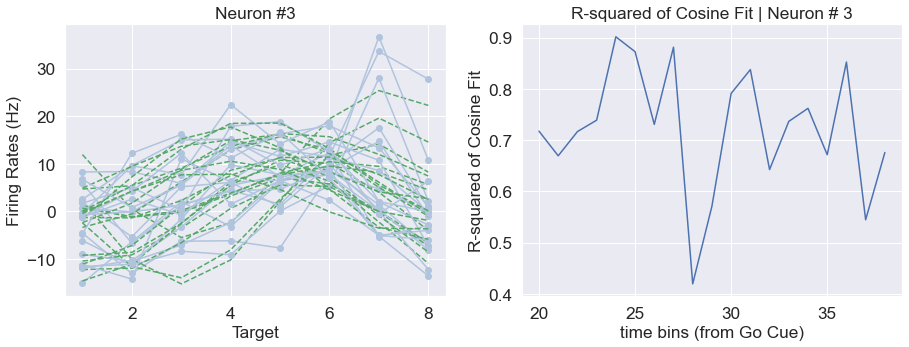

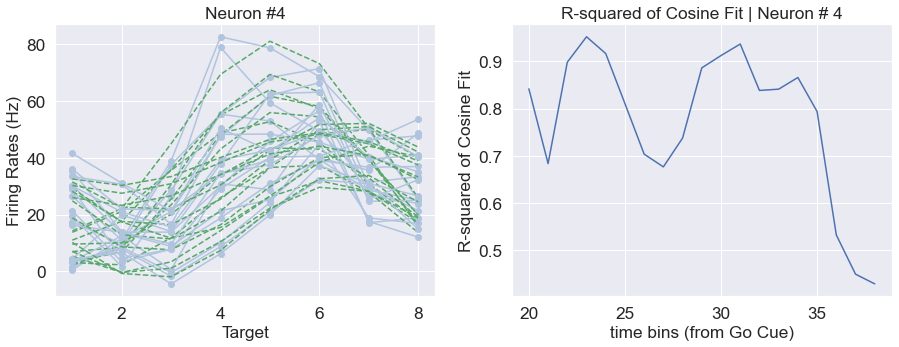

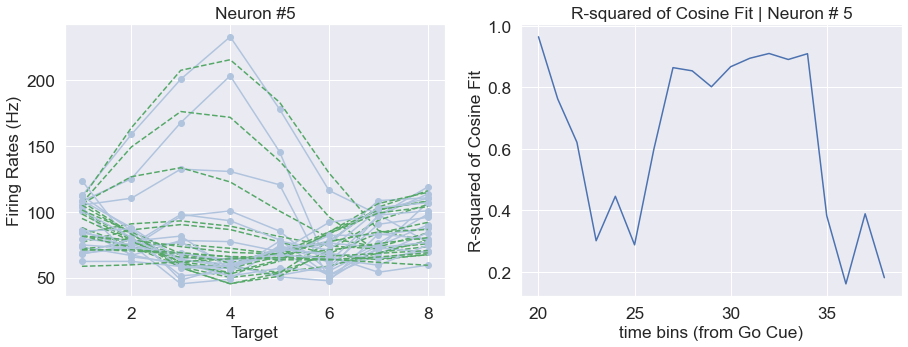

...

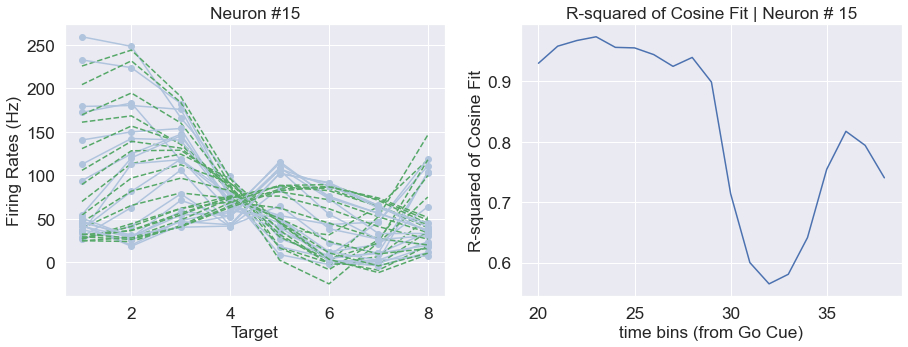

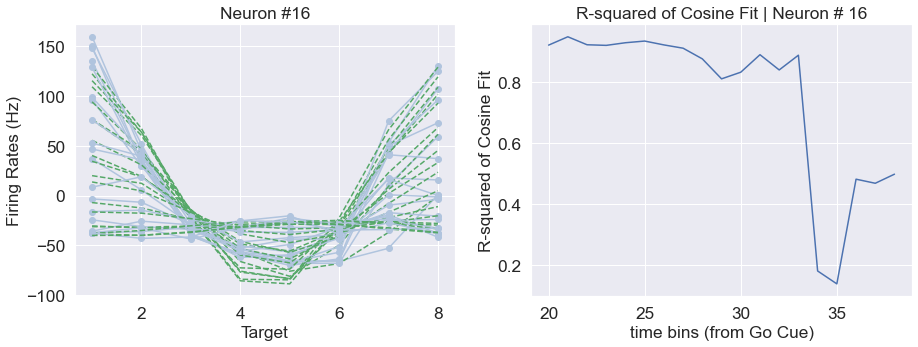

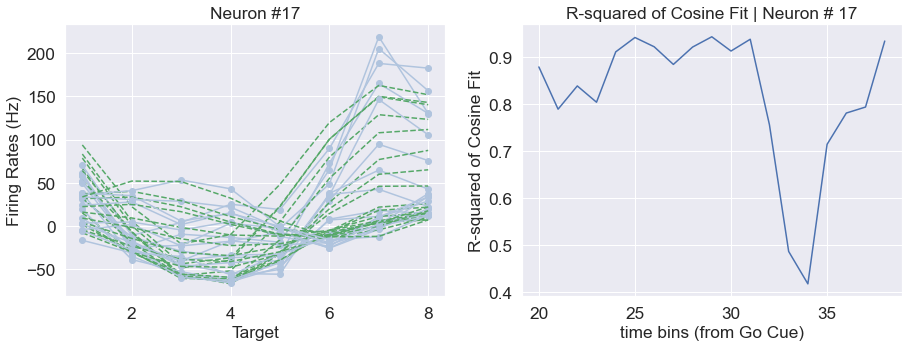

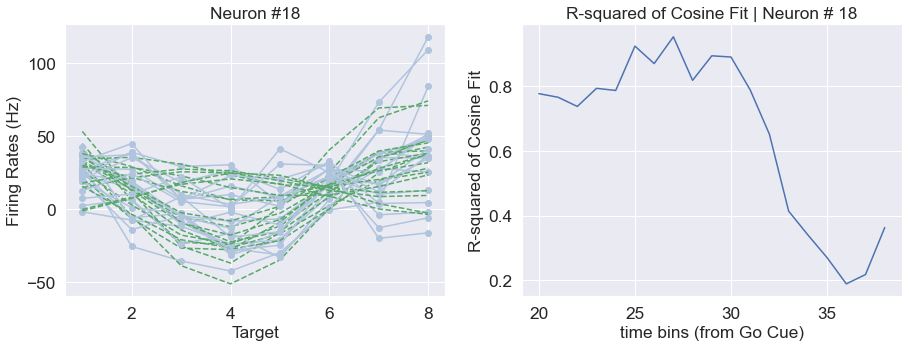

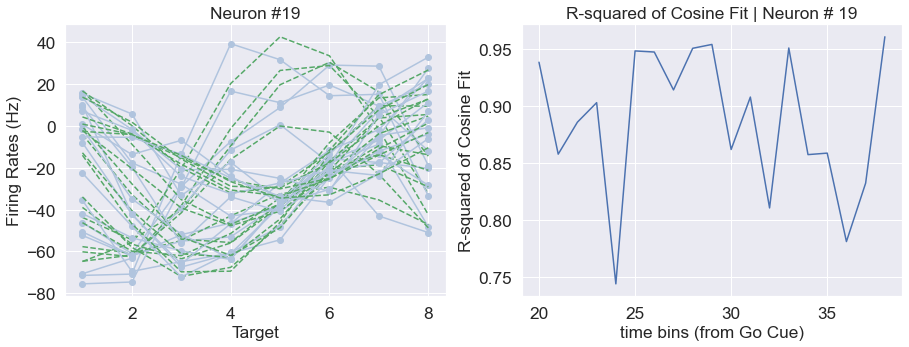

In [145]:
numTarg = 8

tStart = alignCue
tStop = numBins - 1
# tStop = alignCue + 1
x_targs = np.arange(1,9,1)

r2_trials = np.zeros((tStop - tStart, numNeurons))

# going through each neuron
for iN in range(numNeurons):
    n_bmiTargTime = np.zeros((numBins, numTarg))
    n_bmiMin = np.zeros_like(n_bmiTargTime)
    # for each time bin
    fig = plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    for iT in range(tStart, tStop, 1):
    # 40 x neurons x trials 
        n_bmiTargTime[iT, 0] = np.mean(n_bmiUnitsT1[iT, iN, :])
        n_bmiTargTime[iT, 1] = np.mean(n_bmiUnitsT2[iT, iN, :])
        n_bmiTargTime[iT, 2] = np.mean(n_bmiUnitsT3[iT, iN, :])
        n_bmiTargTime[iT, 3] = np.mean(n_bmiUnitsT4[iT, iN, :])
        n_bmiTargTime[iT, 4] = np.mean(n_bmiUnitsT5[iT, iN, :])
        n_bmiTargTime[iT, 5] = np.mean(n_bmiUnitsT6[iT, iN, :])
        n_bmiTargTime[iT, 6] = np.mean(n_bmiUnitsT7[iT, iN, :])
        n_bmiTargTime[iT, 7] = np.mean(n_bmiUnitsT8[iT, iN, :])
        plt.plot(x_targs, n_bmiTargTime[iT], '-o', color = 'lightsteelblue', label=iT)
        (popt, cov) = cosineFitting(x_targs, n_bmiTargTime[iT])
#         print("params", popt)
#         print("cov", cov)
        plt.plot(x_targs, func(x_targs, *popt), 'g--', label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
        r2_trials[iT - tStart, iN] = return_r2(n_bmiTargTime[iT], func(x_targs, *popt)) 
    plt.xlabel("Target")
    plt.ylabel("Firing Rates (Hz)")
#     plt.legend()
    plt.title("Neuron #" + str(iN + 1))
    
    plt.subplot(1, 2, 2)
    plt.plot(np.arange(tStart, tStop, 1), r2_trials[:, iN])
    plt.xlabel("time bins (from Go Cue)")
    plt.ylabel("R-squared of Cosine Fit")
    plt.title("R-squared of Cosine Fit | Neuron # " + str(iN + 1))
#     plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

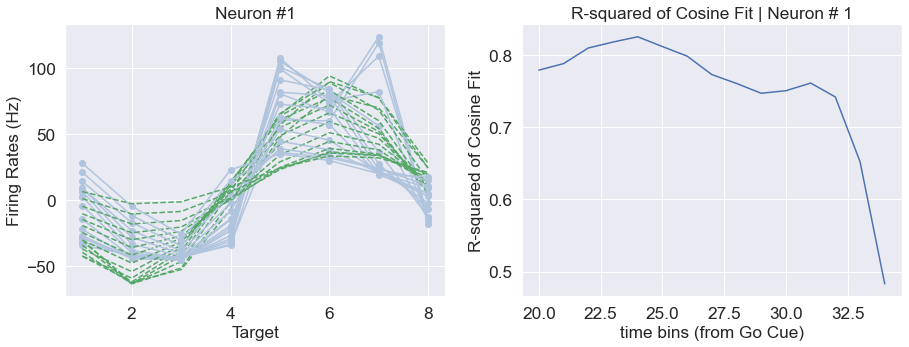

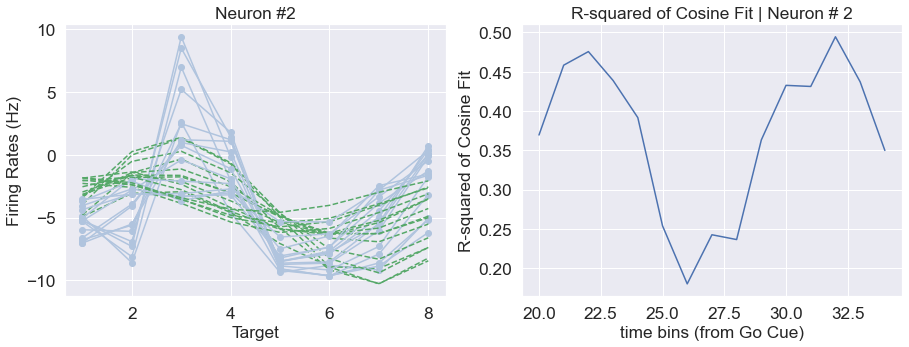

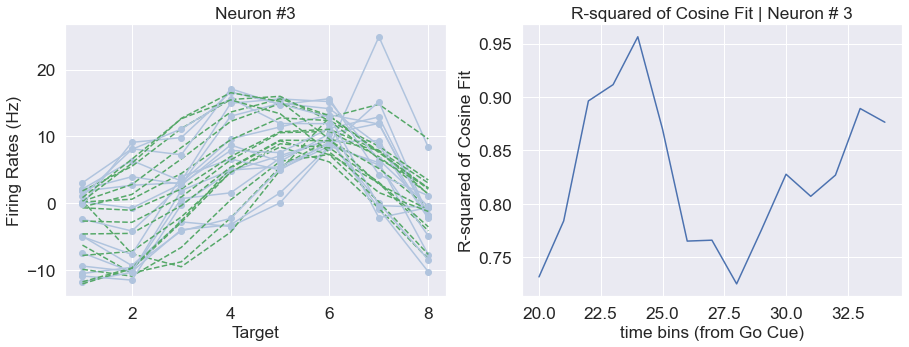

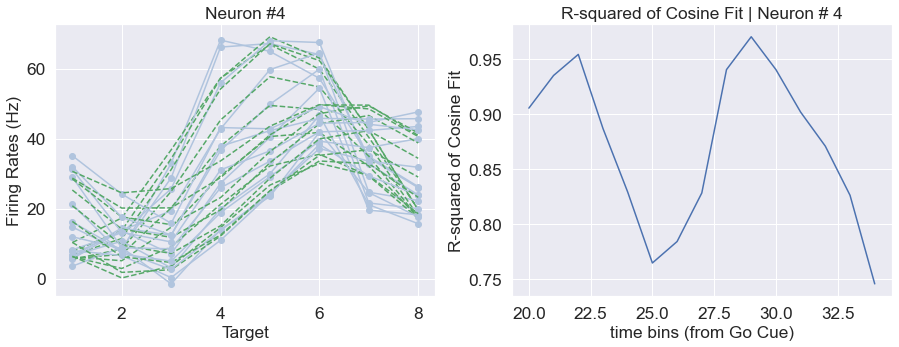

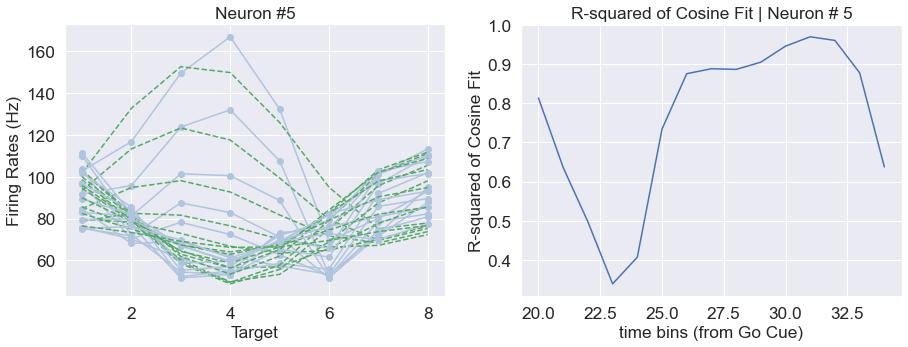

...

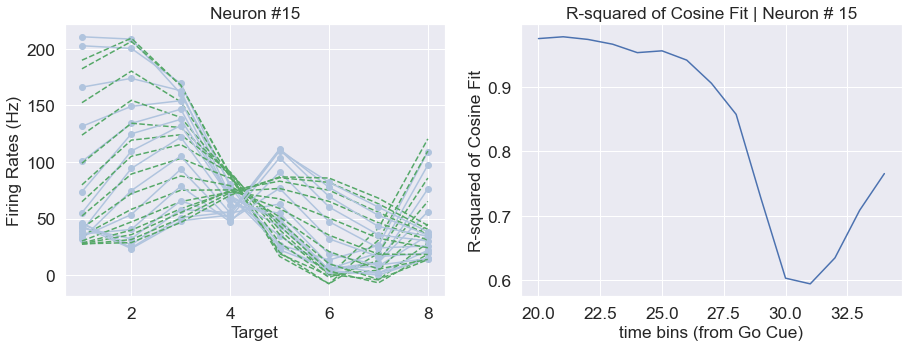

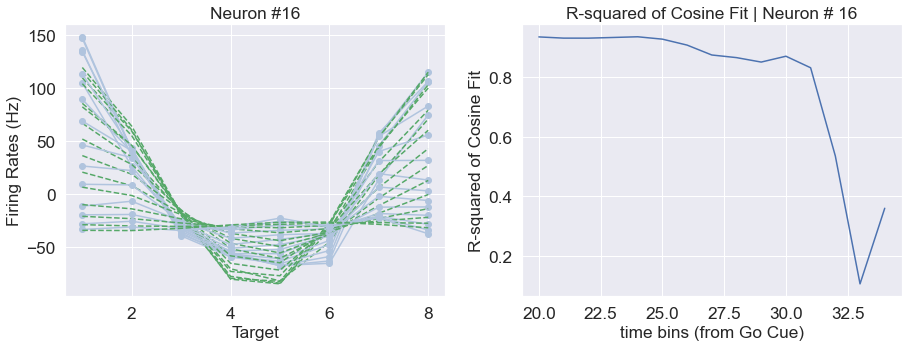

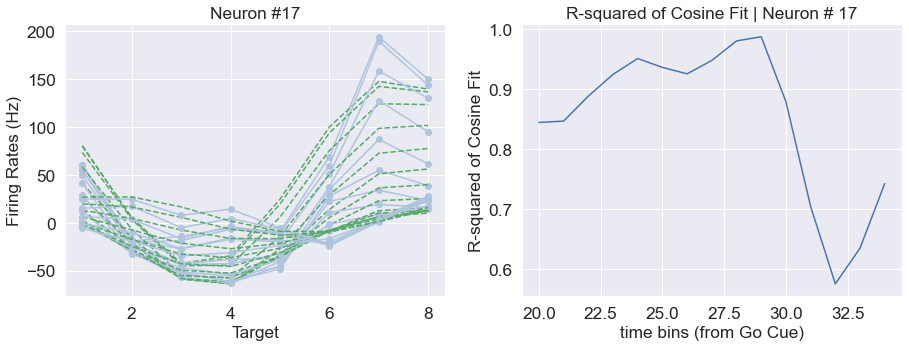

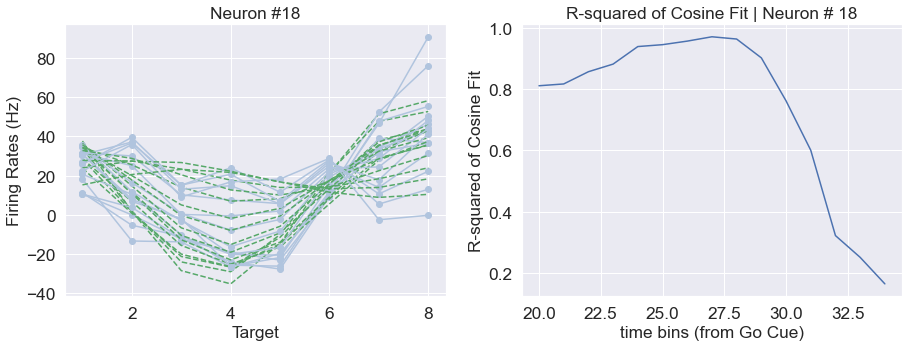

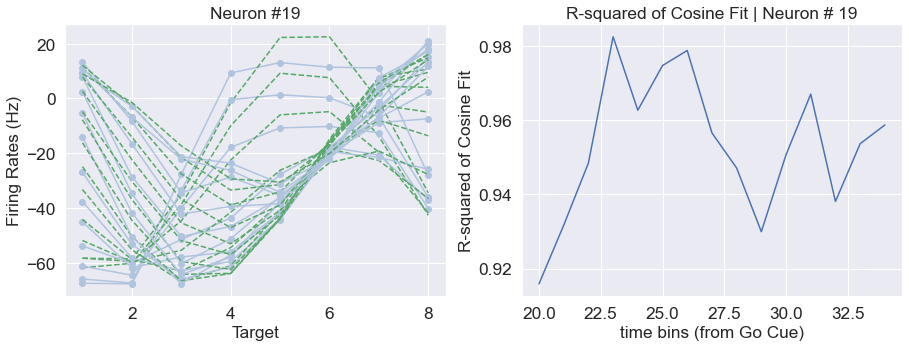

In [146]:
numTarg = 8
avgd = 4

tStart = alignCue
tStop = numBins - 1 - avgd # extra -2 because we're going to average across 2 bins at a time
# tStop = alignCue + 1
x_targs = np.arange(1,9,1)

r2_trials2 = np.zeros((tStop - tStart, numNeurons))

# going through each neuron
for iN in range(numNeurons):
    n_bmiTargTime = np.zeros((numBins, numTarg))
    n_bmiMin = np.zeros_like(n_bmiTargTime)
    # for each time bin
    fig = plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    for iT in range(tStart, tStop, 1):
    # 40 x neurons x trials 
        n_bmiTargTime[iT, 0] = np.mean(n_bmiUnitsT1[iT:iT+avgd, iN, :])
        n_bmiTargTime[iT, 1] = np.mean(n_bmiUnitsT2[iT:iT+avgd, iN, :])
        n_bmiTargTime[iT, 2] = np.mean(n_bmiUnitsT3[iT:iT+avgd, iN, :])
        n_bmiTargTime[iT, 3] = np.mean(n_bmiUnitsT4[iT:iT+avgd, iN, :])
        n_bmiTargTime[iT, 4] = np.mean(n_bmiUnitsT5[iT:iT+avgd, iN, :])
        n_bmiTargTime[iT, 5] = np.mean(n_bmiUnitsT6[iT:iT+avgd, iN, :])
        n_bmiTargTime[iT, 6] = np.mean(n_bmiUnitsT7[iT:iT+avgd, iN, :])
        n_bmiTargTime[iT, 7] = np.mean(n_bmiUnitsT8[iT:iT+avgd, iN, :])
        plt.plot(x_targs, n_bmiTargTime[iT], '-o', color = 'lightsteelblue', label=iT)
        (popt, cov) = cosineFitting(x_targs, n_bmiTargTime[iT])
#         print("params", popt)
#         print("cov", cov)
        plt.plot(x_targs, func(x_targs, *popt), 'g--', label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
        r2_trials2[iT - tStart, iN] = return_r2(n_bmiTargTime[iT], func(x_targs, *popt)) 
    plt.xlabel("Target")
    plt.ylabel("Firing Rates (Hz)")
#     plt.legend()
    plt.title("Neuron #" + str(iN + 1))
    
    plt.subplot(1, 2, 2)
    plt.plot(np.arange(tStart, tStop, 1), r2_trials2[:, iN])
    plt.xlabel("time bins (from Go Cue)")
    plt.ylabel("R-squared of Cosine Fit")
    plt.title("R-squared of Cosine Fit | Neuron # " + str(iN + 1))

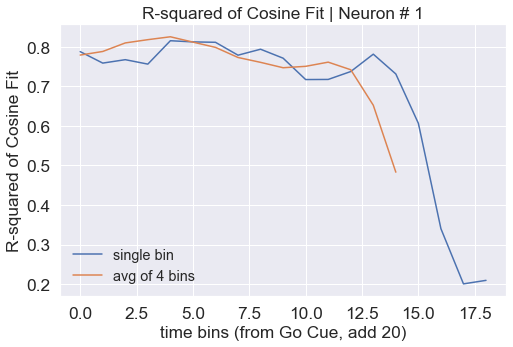

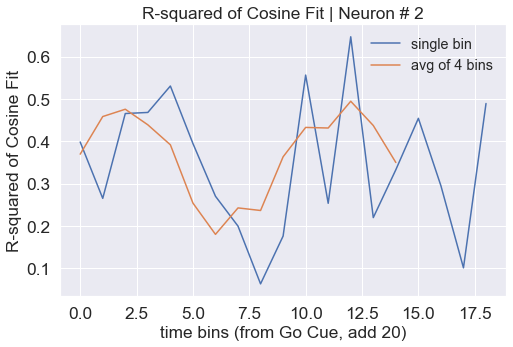

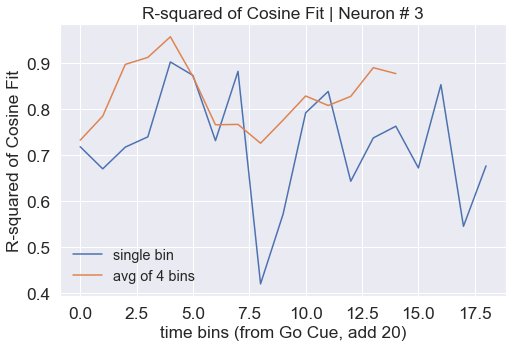

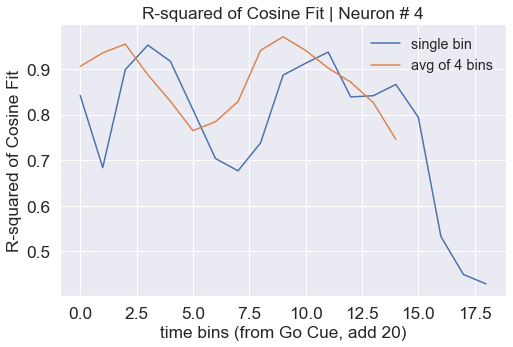

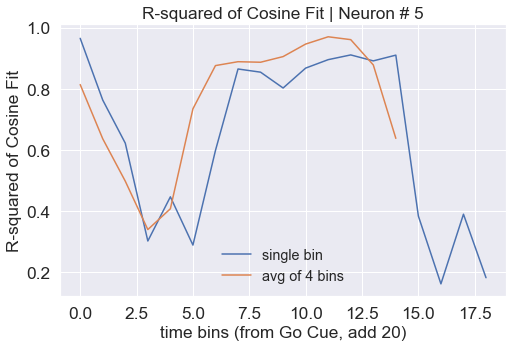

...

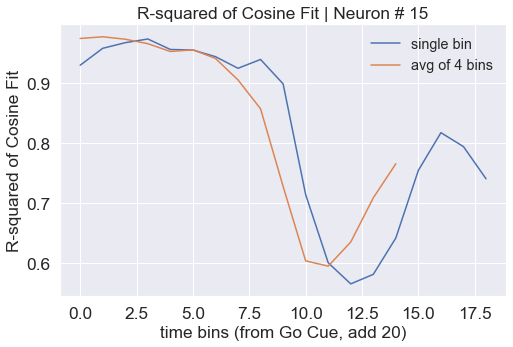

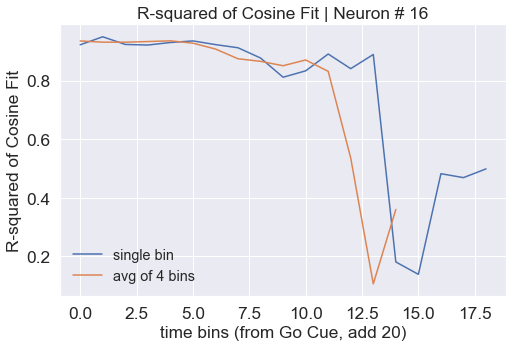

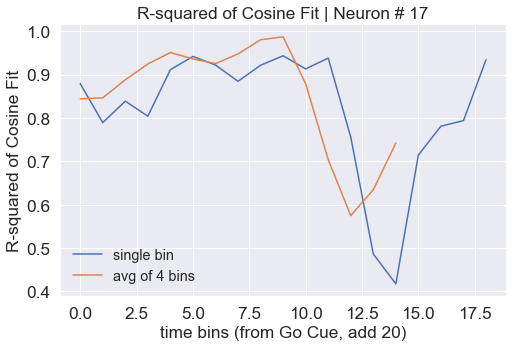

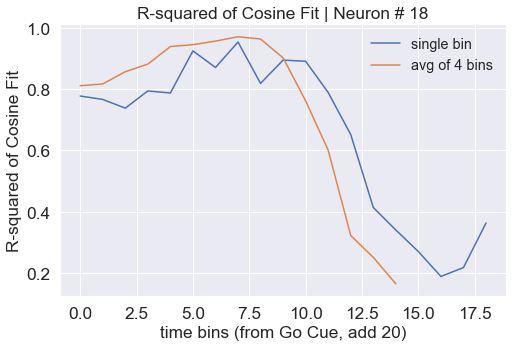

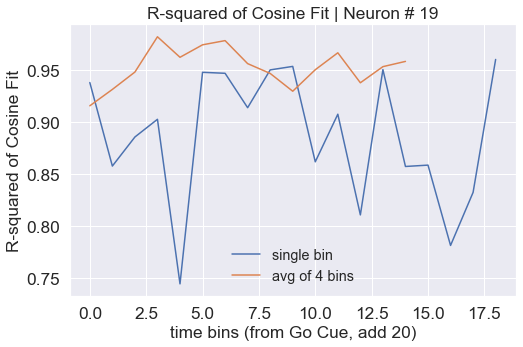

In [147]:
for iN in range(numNeurons):
    plt.plot(r2_trials[:, iN], label='single bin')
    plt.plot(r2_trials2[:, iN], label='avg of '+str(avgd) +' bins')
    plt.xlabel("time bins (from Go Cue, add 20)")
    plt.ylabel("R-squared of Cosine Fit")
    plt.title("R-squared of Cosine Fit | Neuron # " + str(iN + 1))
    plt.legend()
    plt.show()

In [ ]:
# close files to save
pdf.close()